<a id=section2></a>
## 1. Problem Description

- The goal is to **predict the Loan Amount** that can be sanctioned to the customers who have **applied for a home loan** using the features provided in the dataset.

<a id=section2></a>
## 2. Importing Packages

In [917]:
import numpy as np                                                 # Implemennts milti-dimensional array and matrices
import pandas as pd                                                # For data manipulation and analysis
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()

import pandas_profiling
from pandas_profiling import ProfileReport

import warnings
warnings.filterwarnings('ignore')                   # To suppress all the warnings in the notebook.
from subprocess import check_output

In [918]:
import matplotlib.pyplot as plt                                  # Plotting library for Python programming language and it's numerical mathematics extension NumPy
%matplotlib inline

import seaborn as sns                                             # Provides a high level interface for drawing attractive and informative statistical graphics
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

In [919]:
!pip install plotly --upgrade

Requirement already up-to-date: plotly in c:\users\vinoda varshini\anaconda3\lib\site-packages (5.0.0)


In [920]:
!pip install chart-studio

In [921]:
# Making plotly specific imports
# These imports are necessary to use plotly offline without signing in to their website.

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)

In [922]:
# To install pandas profiling please run this command.

!pip install pandas-profiling --upgrade

Requirement already up-to-date: pandas-profiling in c:\users\vinoda varshini\anaconda3\lib\site-packages (3.0.0)


<a id=section3></a>
## 3. Loading Train Data

In [923]:
XYZBank_loan_sanction_train = pd.read_csv(r'C:/Users/VINODA VARSHINI/Documents/HackerEarth/CiplaJune19th2021/dataset/train.csv')
XYZBank_loan_sanction_train

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3.0,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1.0,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1.0,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2.0,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,NaN,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,Angelyn Clevenger,M,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,722.34,Y,Y,2.0,869.61,0,Unpossessed,566,4969.41,4,Urban,1,111096.56,68992.11
29996,C-32511,Silas Slaugh,M,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,253.04,N,N,3.0,729.41,0,Inactive,175,1606.88,3,Urban,1,73453.94,46616.60
29997,C-5192,Carmelo Lone,F,49,NaN,Low,Working,Sales staff,Urban,81410.08,583.11,N,Y,NaN,NaN,0,Active,959,NaN,1,Rural,1,102108.02,61057.56
29998,C-12172,Carolann Osby,M,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,378.29,N,Y,3.0,677.27,1,Unpossessed,375,2417.71,4,Urban,1,168194.47,99766.87


<a id=section301></a>
### 3.1 Description of the Dataset


| Column Name   | Description                                               |
| ------------- |:-------------                                            :| 
| Customer ID   | Represents a unique identification number of a customer   | 
| Name          | Represents the name of a customer                              |  
| Gender        | Respresents the gender of a customer                      | 
| Age           | Represents the age of a customer                          |
| Income(USD)    | Represents the income of a customer                       |
| Income Stability | Represents whether a customer has a stable source of income  |
| Profession        | Represents the profession of a customer |
| Type of Employment  | Represents the type of employment of a customer  |
| Location   | Represents the current location that a customer resides  |
| Loan Amount Requested (USD)  | Represents the loan amount requested by a customer |
| Current Loan Expenses (USD)  | If a customer has any current active loans, then this represents the amount that a customer spendson these loans(monthly)|
| Expense Type 1 | Represents a type of expense that a customer spends on(monthly) |
| Expense Type 2 | Represents a type of expense that a customer spends on(monthly) |
| Dependents  | Represents whether a customer has any dependencies(spouse, parents, siblings, children, etc. |
| Credit Score | Represents the credit score of a customer |
| No. of Defaults | Represents the number of time a customer has defaulted |
| Has Active Credit Card | Represents if a customer has any active credit cards or not |
| Property ID | Represents an identification number of a property |
| Property Age | Represents the age of a property |
| Property Type | Represents the type of property |
| Property Location | Represents the location  of a property |
| Co-Applicant | Represents whether a customer has co-applicants |
| Property Price | Represents the selling price of a property |
| Loan Sanction Amount {USD) | Represents the loan sanctioned amount for a customer |

In [924]:
XYZBank_loan_sanction_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
Customer ID                    30000 non-null object
Name                           30000 non-null object
Gender                         29947 non-null object
Age                            30000 non-null int64
Income (USD)                   25424 non-null float64
Income Stability               28317 non-null object
Profession                     30000 non-null object
Type of Employment             22730 non-null object
Location                       30000 non-null object
Loan Amount Request (USD)      30000 non-null float64
Current Loan Expenses (USD)    29828 non-null float64
Expense Type 1                 30000 non-null object
Expense Type 2                 30000 non-null object
Dependents                     27507 non-null float64
Credit Score                   28297 non-null float64
No. of Defaults                30000 non-null int64
Has Active Credit Card         28434 non

#### Observations :
- ```info``` function gives us the following insights into the XYZBank_loan_sanction  dataframe:

  - There are a total of **30000 samples (rows)** and **24 columns** in the dataframe.
  
  - There are **13 columns** with a **numeric** datatype and **11 columns** with an **object** datatype.
  
  - There are missing values in the dataset in the column **Gender**, **Income (USD)**, **Income Stability**, **Type of Employment**, **Current Loan Expenses**, **Dependents**, **Credit Score**, **Has Active Credit Card**, **Property Age**, **Property Location**, **Loan Sanction Amount(USD)** .

In [925]:
XYZBank_loan_sanction_train.shape

(30000, 24)

- Train dataset of XYZ bank has __30000 rows__ and __24 Columns__

In [926]:
XYZBank_loan_sanction_train.head()           # Displays first 5 records of the dataset.

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3.0,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1.0,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1.0,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2.0,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,NaN,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28


In [927]:
XYZBank_loan_sanction_train.tail()        # Displays last 5 records of teh dataset.

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
29995,C-43723,Angelyn Clevenger,M,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,722.34,Y,Y,2.0,869.61,0,Unpossessed,566,4969.41,4,Urban,1,111096.56,68992.11
29996,C-32511,Silas Slaugh,M,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,253.04,N,N,3.0,729.41,0,Inactive,175,1606.88,3,Urban,1,73453.94,46616.60
29997,C-5192,Carmelo Lone,F,49,NaN,Low,Working,Sales staff,Urban,81410.08,583.11,N,Y,NaN,NaN,0,Active,959,NaN,1,Rural,1,102108.02,61057.56
29998,C-12172,Carolann Osby,M,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,378.29,N,Y,3.0,677.27,1,Unpossessed,375,2417.71,4,Urban,1,168194.47,99766.87
29999,C-33003,Bridget Garibaldi,F,63,3068.24,High,Pensioner,NaN,Rural,156290.54,693.94,N,Y,1.0,815.44,0,Active,344,3068.24,3,Rural,1,194512.60,117217.90


In [928]:
XYZBank_loan_sanction_train['Income Stability'].unique()   # unique() gives the values present inside that particular column.

array(['Low', 'High', nan], dtype=object)

In [929]:
XYZBank_loan_sanction_train['Profession'].unique()   # unique() gives the values present inside that particular column.

array(['Working', 'Pensioner', 'State servant', 'Commercial associate',
       'Unemployed', 'Student', 'Businessman', 'Maternity leave'],
      dtype=object)

In [930]:
XYZBank_loan_sanction_train['Type of Employment'].unique()     # unique() gives the values present inside that particular column.

array(['Sales staff', nan, 'High skill tech staff', 'Secretaries',
       'Laborers', 'Managers', 'Cooking staff', 'Core staff', 'Drivers',
       'Realty agents', 'Security staff', 'Accountants',
       'Private service staff', 'Waiters/barmen staff', 'Medicine staff',
       'Cleaning staff', 'Low-skill Laborers', 'HR staff', 'IT staff'],
      dtype=object)

#### Observations :
- From the 30000 records we are able to find the employment group of our customer by using the unique() function.
     - There are 8 types of Profession in our dataset.
     - In our dataset there are totally 19 types of employment.
        

In [931]:
XYZBank_loan_sanction_train.describe(include = 'all')

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
count,30000,30000,29947,30000.000000,2.542400e+04,28317,30000,22730,30000,30000.000000,29828.000000,30000,30000,27507.000000,28297.000000,30000.000000,28434,30000.000000,2.515000e+04,30000.000000,29644,30000.000000,3.000000e+04,29660.000000
unique,30000,30000,2,NaN,NaN,2,8,18,3,NaN,NaN,2,2,NaN,NaN,NaN,3,NaN,NaN,NaN,3,NaN,NaN,NaN
top,C-20685,Meaghan Halliwell,M,NaN,NaN,Low,Working,Laborers,Semi-Urban,NaN,NaN,N,Y,NaN,NaN,NaN,Active,NaN,NaN,NaN,Semi-Urban,NaN,NaN,NaN
freq,1,1,15053,NaN,NaN,25751,16926,5578,21563,NaN,NaN,19214,20180,NaN,NaN,NaN,9771,NaN,NaN,NaN,10387,NaN,NaN,NaN
mean,NaN,NaN,NaN,40.092300,2.630574e+03,NaN,NaN,NaN,NaN,88826.333855,400.936876,NaN,NaN,2.253027,739.885381,0.193933,NaN,501.934700,2.631119e+03,2.460067,NaN,-4.743867,1.317597e+05,47649.342208
std,NaN,NaN,NaN,16.045129,1.126272e+04,NaN,NaN,NaN,NaN,59536.949605,242.545375,NaN,NaN,0.951162,72.163846,0.395384,NaN,288.158086,1.132268e+04,1.118562,NaN,74.614593,9.354955e+04,48221.146686
min,NaN,NaN,NaN,18.000000,3.777000e+02,NaN,NaN,NaN,NaN,6048.240000,-999.000000,NaN,NaN,1.000000,580.000000,0.000000,NaN,1.000000,3.777000e+02,1.000000,NaN,-999.000000,-9.990000e+02,-999.000000
25%,NaN,NaN,NaN,25.000000,1.650457e+03,NaN,NaN,NaN,NaN,41177.755000,247.667500,NaN,NaN,2.000000,681.880000,0.000000,NaN,251.000000,1.650450e+03,1.000000,NaN,1.000000,6.057216e+04,0.000000
50%,NaN,NaN,NaN,40.000000,2.222435e+03,NaN,NaN,NaN,NaN,75128.075000,375.205000,NaN,NaN,2.000000,739.820000,0.000000,NaN,504.000000,2.223250e+03,2.000000,NaN,1.000000,1.099936e+05,35209.395000
75%,NaN,NaN,NaN,55.000000,3.090593e+03,NaN,NaN,NaN,NaN,119964.605000,521.292500,NaN,NaN,3.000000,799.120000,0.000000,NaN,751.000000,3.091407e+03,3.000000,NaN,1.000000,1.788807e+05,74261.250000


#### Observations:
- ```describe``` function gives us the following insights into the data:
    
   - The distribution of **Income (USD)** is **positive (right skewed)** because the **mean** of **Income (USD) (2.6305) lies to the right** of the **median(50%) value (2.2224)**, on a **distribution plot**. 
   - The distribution of **Loan Amount Request(USD)** is **positive (right skewed)** because the **mean** of **Loan Amount Request(USD) (88826.333) lies to the right** of the **median(50%) value (75128.075)**, on a **distribution plot**. 
   - The distribution of **Credit Score** is **positive (right skewed)** because the **mean** of **Credit Score (739.885) lies to the right** of the **median(50%) value (739.820)**, on a **distribution plot**. 
   - __Current Loan Expenses (USD)__ is an __outlier__, because the max value 3840.8800 lies far away from the mean 400.936

In [932]:
XYZBank_loan_sanction_train.isnull().sum()

Customer ID                    0   
Name                           0   
Gender                         53  
Age                            0   
Income (USD)                   4576
Income Stability               1683
Profession                     0   
Type of Employment             7270
Location                       0   
Loan Amount Request (USD)      0   
Current Loan Expenses (USD)    172 
Expense Type 1                 0   
Expense Type 2                 0   
Dependents                     2493
Credit Score                   1703
No. of Defaults                0   
Has Active Credit Card         1566
Property ID                    0   
Property Age                   4850
Property Type                  0   
Property Location              356 
Co-Applicant                   0   
Property Price                 0   
Loan Sanction Amount (USD)     340 
dtype: int64

#### Observations :
From the above output we can see that __Income(USD)__ , __Income Stability__ , __Type of Employment__ , __Dependents__ ,__Credit Score__ , __Has Active Credit Card__ , __Property Age__ columns contains __maximum null values__. We will see how to deal with them.

<a id=section301></a>
### Pandas Profiling after Data Preprocessing

In [933]:
profile_train = ProfileReport(XYZBank_loan_sanction_train,title='Pandas Profiling before Data Preprocessing')

In [18]:
profile_train

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_train.to_widgets()

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
profile_train.to_file("XYZ_trainreport.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Observations from Pandas Profiling before Data Preprocessing** <br><br>

- __Dataset Info__
     - No. of Variables : 24                            
     - No. of Observations : 30000                      
     - Missing Cells(%) : 3.5%                          
      
- __Variable Type__
     - Categorical : 12
     - Numeric : 10
     - Boolean : 2
         
     
- __Customer ID__ has __High Cardinality__.

   
- __Income (USD)__ is __highly correlated with Property Age__.

   
- __Loan Amount Requested (USD)__ is __highly correlated with Current LoanExpenses(USD)__.

    
- __Age__ and __profession__ is __highly correlated with Income Stability__
   
   
- __Income (USD)__ has __15.3% missing values__.
   
   
- __Income Stabiity__ has __5.6% missing values__.
   
   
- __Type of Employment__ has __24.2% missing values__.
   
   
- __Dependents__ has __8.3% missing values__.
   
   
- __Credit Score__ has __5.7% missing values__.
   
   
- __Has Active Credit card__ has __5.2% missing values__.
   
   
- __Property Age__ has __16.2% missing value__.
   
   
- __Income(USD)__ is __Highly Skewed (γ1 = 154.00172)__.
   
   
- __Property Age__ is __Highly Skewed (γ1 = 153.2196101)__.
   
   
- __Income(USD)__ has __Kurtosis of 24259.66896__.
   
   
- __Credit Score__ has __Kurtosis of -0.9851944799__ and __Skeweness of -0.02025516921__.
     
  

<a id=section401></a>
### 3.3 Final Observations
 - __Property Age__: Drop the column as it has high correlation with Income (USD).
 - __Co-Applicant__: Remove the outlier as it has outlier as -999.
 - __Handle the missing values__ : Income (USD), Credit Score, Dependents has high number of missing values.
 - Handling of NaN values is important.

<a id=section3></a>
## 4. Data Preprocessing

<a id=section401></a>
### 4.1 Handling missing values

- Gender has 53 missing values. Replacing these missing values with the value which occur frequently.

In [934]:
XYZBank_loan_sanction_train['Gender'].value_counts()

M    15053
F    14894
Name: Gender, dtype: int64

In [935]:
XYZBank_loan_sanction_train[XYZBank_loan_sanction_train ['Gender'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
1095,C-13881,Sherwood Abbott,NaN,19,5002.91,NaN,Commercial associate,Managers,Semi-Urban,263939.86,736.19,N,Y,1.0,NaN,1,Unpossessed,744,5002.91,4,Semi-Urban,1,490050.55,184757.90
1211,C-36542,Stephaine Ferber,NaN,50,1880.45,Low,Working,Drivers,Rural,41182.62,333.09,Y,N,2.0,693.34,1,Active,691,1880.45,4,Rural,1,68239.88,28827.83
2092,C-39265,Aleta Gregoire,NaN,61,2427.46,High,Pensioner,NaN,Semi-Urban,86585.93,400.69,N,Y,1.0,867.82,0,Active,571,2427.46,2,Urban,0,136287.92,69268.74
2964,C-9424,Alva Beauchesne,NaN,18,3188.73,Low,Commercial associate,NaN,Urban,27444.59,136.24,N,N,1.0,797.76,0,Inactive,927,3188.73,4,Rural,1,40899.77,19211.21
4216,C-38459,Silas Deford,NaN,65,2728.97,High,Pensioner,NaN,Semi-Urban,63132.91,420.87,N,Y,2.0,849.88,0,Inactive,963,2728.97,1,Rural,0,101911.82,44193.04
4424,C-28882,Nana Mccleery,NaN,60,2648.28,High,Pensioner,NaN,Semi-Urban,106323.64,311.04,Y,Y,2.0,806.75,0,Unpossessed,632,2648.28,3,Urban,1,181045.39,79742.73
5148,C-7517,Sherie Puente,NaN,34,1233.27,Low,Commercial associate,Core staff,Semi-Urban,144397.54,416.23,N,Y,2.0,846.37,0,Unpossessed,680,1233.27,1,Semi-Urban,1,192306.56,108298.16
5433,C-9812,Vera Clubb,NaN,18,NaN,Low,Working,Sales staff,Semi-Urban,108606.43,460.91,N,Y,2.0,721.82,0,Active,408,NaN,1,Urban,1,134510.54,-999.00
6300,C-11377,Adolfo Kinch,NaN,47,2592.45,Low,State servant,NaN,Semi-Urban,62085.35,497.68,Y,Y,1.0,771.33,0,Active,430,2592.45,4,Rural,1,105541.85,49668.28
6853,C-6091,Perry Howey,NaN,32,4394.39,Low,Commercial associate,Managers,Semi-Urban,110486.24,432.55,Y,Y,3.0,802.93,0,Unpossessed,840,4394.39,1,Rural,1,149051.29,88388.99


In [936]:
XYZBank_loan_sanction_train['Gender'].fillna('M',inplace = True)

 - Dependents denote the number of family members who are related to the customers. We can see there are __2493 records__ that has NaN which is missing.
 - __Co-Applicants__ are the second person who are also family members to the customer applying for the loan. So, if the __Co-Applicant is '1' then we can update the missing Dependents value by '1'__. If the __Co-Applicant is '0', then the missing value for dependent can be updated as '0'__, thus reducing the number of missing value for Dependents.

In [937]:
XYZBank_loan_sanction_train[XYZBank_loan_sanction_train ['Dependents'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,NaN,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
19,C-20654,Dian Myles,F,41,1837.17,Low,Working,Security staff,Rural,112910.57,422.61,Y,N,NaN,722.74,0,Inactive,499,1837.17,4,Urban,1,128407.60,73391.87
31,C-14489,Stephane Arnott,F,18,NaN,Low,Working,NaN,Semi-Urban,85927.28,217.19,N,N,NaN,688.21,0,NaN,854,NaN,2,Rural,1,160151.78,60149.10
46,C-21608,Danica Villacorta,M,54,1871.92,Low,Working,Accountants,Semi-Urban,55863.31,318.76,N,Y,NaN,797.47,0,Active,279,1871.92,4,Semi-Urban,1,102110.07,44690.65
49,C-16602,Dorotha Kilgore,M,59,NaN,Low,Commercial associate,NaN,Semi-Urban,155502.39,502.13,N,N,NaN,855.39,1,Unpossessed,956,NaN,2,Semi-Urban,1,228079.45,116626.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29936,C-11631,Edna Jelley,F,54,NaN,Low,Working,Core staff,Semi-Urban,79030.18,252.09,Y,N,NaN,698.49,0,Active,150,NaN,3,Semi-Urban,1,104437.78,NaN
29941,C-29993,Levi Guider,M,62,1834.22,High,Pensioner,NaN,Semi-Urban,89484.00,287.01,Y,N,NaN,726.31,0,Inactive,407,1834.22,2,Semi-Urban,0,164726.89,62638.80
29952,C-16277,Blossom Paramore,F,44,NaN,Low,Commercial associate,Core staff,Semi-Urban,99347.78,521.05,N,Y,NaN,612.38,0,Active,851,NaN,3,Rural,0,117611.49,0.00
29981,C-8444,Kiyoko Houseknecht,M,62,1608.93,High,Pensioner,NaN,Semi-Urban,136973.99,432.53,N,Y,NaN,737.01,0,Inactive,395,1608.93,4,Rural,1,214606.95,89033.09


In [938]:
XYZBank_loan_sanction_train['Co-Applicant'].value_counts(sort=True)

 1      25516
 0      4316 
-999    168  
Name: Co-Applicant, dtype: int64

In [939]:
XYZBank_loan_sanction_train.loc[XYZBank_loan_sanction_train['Co-Applicant'] == -999]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
62,C-25696,Pam Messmer,M,51,1993.49,NaN,Working,Private service staff,Rural,97298.45,275.74,Y,Y,2.0,801.23,0,Active,94,1993.49,1,Urban,-999,157137.04,68108.91
98,C-16531,Mendy Mcclean,M,18,1532.00,Low,Working,NaN,Semi-Urban,33819.92,170.24,Y,Y,4.0,682.04,0,Unpossessed,184,1532.00,4,Rural,-999,49033.50,21982.95
150,C-13983,Yolonda Seeber,M,36,2142.63,Low,Working,Core staff,Semi-Urban,47814.96,261.43,N,Y,1.0,847.83,1,Inactive,762,2142.63,1,Rural,-999,83481.60,35861.22
812,C-23334,Sparkle Reich,F,29,5213.26,Low,Commercial associate,Managers,Semi-Urban,91111.32,500.92,N,Y,3.0,707.24,0,Inactive,378,5213.26,2,Rural,-999,131613.08,63777.92
1077,C-5559,Lizette Griffiths,F,50,NaN,NaN,Working,Managers,Semi-Urban,101100.43,728.76,N,Y,NaN,789.29,0,Unpossessed,427,NaN,4,Semi-Urban,-999,183182.50,70770.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29312,C-19945,Danica Andrzejewski,F,20,4489.91,Low,Commercial associate,High skill tech staff,Urban,351190.52,917.72,N,N,3.0,715.87,1,NaN,311,4489.91,4,Semi-Urban,-999,409300.71,245833.36
29531,C-14313,Nannie Augusta,M,61,3705.62,Low,Commercial associate,NaN,Semi-Urban,43979.64,228.39,N,Y,2.0,697.78,0,Inactive,155,3705.62,4,Semi-Urban,-999,50269.41,30785.75
29611,C-13954,Nikki Resto,F,41,4130.76,Low,Commercial associate,Laborers,Semi-Urban,220174.62,652.18,Y,Y,1.0,789.50,0,Active,645,4130.76,2,Rural,-999,307019.64,165130.96
29821,C-25387,Lizette Pfarr,F,61,3509.29,Low,Working,Sales staff,Semi-Urban,70909.68,355.09,N,N,2.0,718.31,1,Active,189,3509.29,3,Urban,-999,-999.00,46091.29


- Co-Applicant value as -999 is not valid. So replacing it by '1'.

In [940]:
XYZBank_loan_sanction_train.replace(to_replace = -999,value = 1,inplace = True)
XYZBank_loan_sanction_train

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3.0,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1.0,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1.0,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2.0,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,NaN,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,Angelyn Clevenger,M,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,722.34,Y,Y,2.0,869.61,0,Unpossessed,566,4969.41,4,Urban,1,111096.56,68992.11
29996,C-32511,Silas Slaugh,M,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,253.04,N,N,3.0,729.41,0,Inactive,175,1606.88,3,Urban,1,73453.94,46616.60
29997,C-5192,Carmelo Lone,F,49,NaN,Low,Working,Sales staff,Urban,81410.08,583.11,N,Y,NaN,NaN,0,Active,959,NaN,1,Rural,1,102108.02,61057.56
29998,C-12172,Carolann Osby,M,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,378.29,N,Y,3.0,677.27,1,Unpossessed,375,2417.71,4,Urban,1,168194.47,99766.87


In [941]:
XYZBank_loan_sanction_train['Co-Applicant'].unique()

array([1, 0], dtype=int64)

- Replacing the missing values of Dependents column by checking the Co-Applicant. If there is a Co-Applicant then the customer has a dependent. If there is no Co-Applicant then the customer does not have dependent.

In [942]:
XYZBank_loan_sanction_train['Dependents'].fillna(XYZBank_loan_sanction_train['Co-Applicant'],inplace = True)          
XYZBank_loan_sanction_train

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3.0,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1.0,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1.0,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2.0,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,1.0,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,Angelyn Clevenger,M,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,722.34,Y,Y,2.0,869.61,0,Unpossessed,566,4969.41,4,Urban,1,111096.56,68992.11
29996,C-32511,Silas Slaugh,M,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,253.04,N,N,3.0,729.41,0,Inactive,175,1606.88,3,Urban,1,73453.94,46616.60
29997,C-5192,Carmelo Lone,F,49,NaN,Low,Working,Sales staff,Urban,81410.08,583.11,N,Y,1.0,NaN,0,Active,959,NaN,1,Rural,1,102108.02,61057.56
29998,C-12172,Carolann Osby,M,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,378.29,N,Y,3.0,677.27,1,Unpossessed,375,2417.71,4,Urban,1,168194.47,99766.87


- Since the __Dependents cannot be a decimal number, we are chnging it to whole number__.

In [943]:
XYZBank_loan_sanction_train['Dependents'] = XYZBank_loan_sanction_train['Dependents'].apply(np.floor).astype(int)
XYZBank_loan_sanction_train.head()

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,1,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28


- We can see that the Income (USD) has more missing values. 


In [944]:
XYZBank_loan_sanction_train['Profession'].value_counts(sort = True)

Working                 16926
Commercial associate    7962 
Pensioner               2740 
State servant           2366 
Unemployed              2    
Businessman             2    
Student                 1    
Maternity leave         1    
Name: Profession, dtype: int64

In [945]:
XYZBank_loan_sanction_train.loc[XYZBank_loan_sanction_train['Profession'] == 'Student']


,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
8078,C-22417,Nova Jacobi,M,36,1914.58,NaN,Student,NaN,Semi-Urban,58056.11,345.2,N,N,1,637.14,1,Inactive,97,1914.58,1,Rural,1,68168.07,0.0


In [946]:
XYZBank_loan_sanction_train[['Income (USD)','Profession']]

,Income (USD),Profession
0,1933.05,Working
1,4952.91,Working
2,988.19,Pensioner
3,NaN,Pensioner
4,2614.77,Working
...,...,...
29995,4969.41,Commercial associate
29996,1606.88,Working
29997,NaN,Working
29998,2417.71,Working


In [947]:
XYZBank_loan_sanction_train['Profession'][XYZBank_loan_sanction_train['Income (USD)'].isna()].unique()

array(['Pensioner', 'State servant', 'Working', 'Commercial associate',
       'Unemployed', 'Maternity leave'], dtype=object)

- __Updating__ the __missing values of Income (USD)__ by taking the __mean of the Income (USD)__.

In [948]:
XYZBank_loan_sanction_train['Income (USD)'].fillna(XYZBank_loan_sanction_train['Income (USD)'].mean(),inplace=True)
XYZBank_loan_sanction_train.head(100)

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.050000,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.910000,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.190000,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,2630.574417,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.770000,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,1,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-48542,Minerva Ramos,F,51,6060.900000,Low,Working,Managers,Urban,102169.74,738.55,N,N,3,851.94,1,Inactive,434,6060.90,3,Rural,1,139187.56,86844.28
96,C-29986,Miguelina Rodas,F,18,2630.574417,Low,Working,Laborers,Semi-Urban,30911.17,152.44,Y,Y,3,NaN,0,NaN,662,NaN,4,Semi-Urban,1,41720.56,21637.82
97,C-21730,Wiley Macrae,F,40,2630.574417,Low,Working,Security staff,Urban,76049.06,341.29,N,Y,2,760.05,0,Inactive,604,NaN,1,NaN,1,89983.16,60839.25
98,C-16531,Mendy Mcclean,M,18,1532.000000,Low,Working,NaN,Semi-Urban,33819.92,170.24,Y,Y,4,682.04,0,Unpossessed,184,1532.00,4,Rural,1,49033.50,21982.95


- __Updating missing values in Credit Score with the Mean.__

In [949]:
XYZBank_loan_sanction_train['Credit Score'].fillna(XYZBank_loan_sanction_train['Credit Score'].mean(),inplace=True)
XYZBank_loan_sanction_train.head(100)

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.050000,Low,Working,Sales staff,Semi-Urban,72809.58,241.08,N,N,3,809.440000,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.910000,Low,Working,NaN,Semi-Urban,46837.47,495.81,N,Y,1,780.400000,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.190000,High,Pensioner,NaN,Semi-Urban,45593.04,171.95,N,Y,1,833.150000,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,2630.574417,High,Pensioner,NaN,Rural,80057.92,298.54,N,Y,2,832.700000,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.770000,Low,Working,High skill tech staff,Semi-Urban,113858.89,491.41,N,Y,1,745.550000,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-48542,Minerva Ramos,F,51,6060.900000,Low,Working,Managers,Urban,102169.74,738.55,N,N,3,851.940000,1,Inactive,434,6060.90,3,Rural,1,139187.56,86844.28
96,C-29986,Miguelina Rodas,F,18,2630.574417,Low,Working,Laborers,Semi-Urban,30911.17,152.44,Y,Y,3,739.885381,0,NaN,662,NaN,4,Semi-Urban,1,41720.56,21637.82
97,C-21730,Wiley Macrae,F,40,2630.574417,Low,Working,Security staff,Urban,76049.06,341.29,N,Y,2,760.050000,0,Inactive,604,NaN,1,NaN,1,89983.16,60839.25
98,C-16531,Mendy Mcclean,M,18,1532.000000,Low,Working,NaN,Semi-Urban,33819.92,170.24,Y,Y,4,682.040000,0,Unpossessed,184,1532.00,4,Rural,1,49033.50,21982.95


- __Dropping the column Gender, Type of Employment, Property Age and Property Location__


In [950]:
XYZBank_loan_sanction_train = XYZBank_loan_sanction_train.drop(['Name','Type of Employment','Property Age'],axis =1)
XYZBank_loan_sanction_train

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,N,N,3,809.440000,0,NaN,746,4,Rural,1,119933.46,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,N,Y,1,780.400000,0,Unpossessed,608,2,Rural,1,54791.00,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,N,Y,1,833.150000,0,Unpossessed,546,2,Urban,0,72440.58,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,N,Y,2,832.700000,1,Unpossessed,890,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,N,Y,1,745.550000,1,Active,715,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,M,38,4969.410000,Low,Commercial associate,Urban,76657.90,722.34,Y,Y,2,869.610000,0,Unpossessed,566,4,Urban,1,111096.56,68992.11
29996,C-32511,M,20,1606.880000,Low,Working,Semi-Urban,66595.14,253.04,N,N,3,729.410000,0,Inactive,175,3,Urban,1,73453.94,46616.60
29997,C-5192,F,49,2630.574417,Low,Working,Urban,81410.08,583.11,N,Y,1,739.885381,0,Active,959,1,Rural,1,102108.02,61057.56
29998,C-12172,M,38,2417.710000,Low,Working,Semi-Urban,142524.10,378.29,N,Y,3,677.270000,1,Unpossessed,375,4,Urban,1,168194.47,99766.87


In [951]:
XYZBank_loan_sanction_train[XYZBank_loan_sanction_train['Current Loan Expenses (USD)'].isna()]

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
271,C-11845,F,32,1917.540000,Low,Commercial associate,Semi-Urban,110305.49,NaN,Y,Y,3,737.470000,1,Unpossessed,828,3,Rural,1,170604.80,71698.57
358,C-6899,M,18,1931.420000,NaN,Commercial associate,Rural,23054.82,NaN,N,N,3,739.885381,0,Inactive,200,1,Urban,1,32068.05,16138.37
806,C-16465,F,18,4271.610000,Low,Working,Semi-Urban,230652.53,NaN,Y,N,1,805.040000,0,NaN,169,2,Urban,1,305605.66,172989.40
1022,C-5338,M,18,3751.770000,Low,Working,Semi-Urban,84041.66,NaN,Y,Y,2,617.450000,0,Active,791,1,Rural,1,105826.91,0.00
1192,C-25920,F,63,2630.574417,High,Pensioner,Semi-Urban,117132.81,NaN,N,Y,1,879.590000,0,Inactive,1,1,Urban,1,157503.64,81992.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29271,C-28729,M,56,2622.650000,Low,Working,Semi-Urban,34305.77,NaN,Y,Y,3,692.050000,0,Inactive,265,3,Urban,1,41663.51,24014.04
29390,C-12410,M,41,2630.574417,Low,Commercial associate,Semi-Urban,26777.25,NaN,Y,Y,3,686.510000,0,Unpossessed,493,3,Rural,1,45498.98,17405.21
29512,C-11024,F,60,2630.574417,Low,Working,Rural,101510.90,NaN,Y,Y,2,739.885381,1,Active,822,1,Urban,1,185816.18,76133.17
29755,C-15075,F,42,1521.220000,Low,Working,Semi-Urban,64997.54,NaN,Y,N,3,615.800000,0,Active,394,2,Urban,1,93662.49,0.00


- __Updating missing values of Current Loan Expenses (USD) with mean.__

In [952]:
XYZBank_loan_sanction_train['Current Loan Expenses (USD)'].fillna(XYZBank_loan_sanction_train['Current Loan Expenses (USD)'].mean(),inplace=True)
XYZBank_loan_sanction_train.head(100)

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,N,N,3,809.440000,0,NaN,746,4,Rural,1,119933.46,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,N,Y,1,780.400000,0,Unpossessed,608,2,Rural,1,54791.00,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,N,Y,1,833.150000,0,Unpossessed,546,2,Urban,0,72440.58,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,N,Y,2,832.700000,1,Unpossessed,890,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,N,Y,1,745.550000,1,Active,715,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-48542,F,51,6060.900000,Low,Working,Urban,102169.74,738.55,N,N,3,851.940000,1,Inactive,434,3,Rural,1,139187.56,86844.28
96,C-29986,F,18,2630.574417,Low,Working,Semi-Urban,30911.17,152.44,Y,Y,3,739.885381,0,NaN,662,4,Semi-Urban,1,41720.56,21637.82
97,C-21730,F,40,2630.574417,Low,Working,Urban,76049.06,341.29,N,Y,2,760.050000,0,Inactive,604,1,NaN,1,89983.16,60839.25
98,C-16531,M,18,1532.000000,Low,Working,Semi-Urban,33819.92,170.24,Y,Y,4,682.040000,0,Unpossessed,184,4,Rural,1,49033.50,21982.95


In [953]:
XYZBank_loan_sanction_train[XYZBank_loan_sanction_train['Loan Sanction Amount (USD)'] == 0.0]

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
6,C-23855,M,43,2361.56,Low,Working,Semi-Urban,152561.34,697.67,Y,Y,2,637.29,0,Unpossessed,227,1,Semi-Urban,1,221050.80,0.0
9,C-24944,M,18,1546.17,Low,Working,Rural,42091.29,500.20,N,N,2,613.24,0,Unpossessed,883,2,Urban,1,67993.43,0.0
11,C-37677,F,39,2719.74,Low,Commercial associate,Semi-Urban,20879.96,93.99,Y,N,2,646.21,0,NaN,196,2,Rural,0,33568.47,0.0
16,C-45549,F,61,2077.42,Low,Working,Semi-Urban,70815.01,417.01,N,N,1,779.55,0,Inactive,395,4,Rural,1,102502.20,0.0
20,C-49922,F,32,1537.82,Low,Working,Rural,93103.63,351.54,Y,Y,3,671.65,0,Inactive,413,2,Urban,0,116861.82,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29982,C-35730,M,35,1470.42,Low,Commercial associate,Semi-Urban,169086.26,451.75,N,N,3,627.60,0,Active,186,4,Urban,1,286547.01,0.0
29983,C-45413,F,18,2834.21,Low,State servant,Semi-Urban,41912.80,201.83,Y,Y,5,746.57,1,Inactive,697,1,Semi-Urban,0,53793.73,0.0
29988,C-43757,F,45,1405.64,Low,Working,Semi-Urban,27956.97,137.24,Y,N,3,661.05,0,Inactive,874,1,Urban,0,37757.51,0.0
29990,C-49100,F,64,4211.81,Low,Commercial associate,Urban,225434.35,867.88,N,N,3,842.81,0,Unpossessed,408,1,Urban,1,285966.63,0.0


- There are missing values in the target variable. This might be data entry mistake. So, for good prediction in our model we are __replacing NaN with Zeros in Loan Sanction Amount (USD)__.

In [954]:
XYZBank_loan_sanction_train['Loan Sanction Amount (USD)'] = XYZBank_loan_sanction_train['Loan Sanction Amount (USD)'].fillna(0)

In [955]:
XYZBank_loan_sanction_train.head(100)

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,N,N,3,809.440000,0,NaN,746,4,Rural,1,119933.46,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,N,Y,1,780.400000,0,Unpossessed,608,2,Rural,1,54791.00,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,N,Y,1,833.150000,0,Unpossessed,546,2,Urban,0,72440.58,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,N,Y,2,832.700000,1,Unpossessed,890,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,N,Y,1,745.550000,1,Active,715,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-48542,F,51,6060.900000,Low,Working,Urban,102169.74,738.55,N,N,3,851.940000,1,Inactive,434,3,Rural,1,139187.56,86844.28
96,C-29986,F,18,2630.574417,Low,Working,Semi-Urban,30911.17,152.44,Y,Y,3,739.885381,0,NaN,662,4,Semi-Urban,1,41720.56,21637.82
97,C-21730,F,40,2630.574417,Low,Working,Urban,76049.06,341.29,N,Y,2,760.050000,0,Inactive,604,1,NaN,1,89983.16,60839.25
98,C-16531,M,18,1532.000000,Low,Working,Semi-Urban,33819.92,170.24,Y,Y,4,682.040000,0,Unpossessed,184,4,Rural,1,49033.50,21982.95


In [956]:
XYZBank_loan_sanction_train.isnull().sum()

Customer ID                    0   
Gender                         0   
Age                            0   
Income (USD)                   0   
Income Stability               1683
Profession                     0   
Location                       0   
Loan Amount Request (USD)      0   
Current Loan Expenses (USD)    0   
Expense Type 1                 0   
Expense Type 2                 0   
Dependents                     0   
Credit Score                   0   
No. of Defaults                0   
Has Active Credit Card         1566
Property ID                    0   
Property Type                  0   
Property Location              356 
Co-Applicant                   0   
Property Price                 0   
Loan Sanction Amount (USD)     0   
dtype: int64

In [957]:
XYZBank_loan_sanction_train['Income Stability'].value_counts()

Low     25751
High    2566 
Name: Income Stability, dtype: int64

- Updating the missing values of the column Income Stability to __Low__.

In [958]:
XYZBank_loan_sanction_train['Income Stability'].fillna('Low',inplace = True)

In [959]:
XYZBank_loan_sanction_train['Property Location'].value_counts()

Semi-Urban    10387
Rural         10041
Urban         9216 
Name: Property Location, dtype: int64

- __Property Location has 356 missing values__. Since, there is no missing values in the Property ID, there is no chance that the customer does not have any property. So, we are updating the missing values by __Rural__.

In [960]:
XYZBank_loan_sanction_train['Property Location'].fillna('Rural',inplace = True)

In [961]:
XYZBank_loan_sanction_train['Has Active Credit Card'].value_counts()

Active         9771
Inactive       9466
Unpossessed    9197
Name: Has Active Credit Card, dtype: int64

- The column __Has Active Credit Card__ has missing values. It may be due to the customer does not possess a credit card. So, we are updating the missing values to __Unpossessed__.

In [962]:
XYZBank_loan_sanction_train['Has Active Credit Card'].fillna('Unpossessed',inplace = True)

In [963]:
XYZBank_loan_sanction_train.isnull().sum()

Customer ID                    0
Gender                         0
Age                            0
Income (USD)                   0
Income Stability               0
Profession                     0
Location                       0
Loan Amount Request (USD)      0
Current Loan Expenses (USD)    0
Expense Type 1                 0
Expense Type 2                 0
Dependents                     0
Credit Score                   0
No. of Defaults                0
Has Active Credit Card         0
Property ID                    0
Property Type                  0
Property Location              0
Co-Applicant                   0
Property Price                 0
Loan Sanction Amount (USD)     0
dtype: int64

<a id=section301></a>
### 4.2 Pandas Profiling after Data Preprocessing

In [634]:
profile_train = ProfileReport(XYZBank_loan_sanction_train,title='Pandas Profiling after Data Preprocessing')

In [131]:
profile_train.to_file("XYZ_trainreport_after_datapreprocessing.html")

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

<a id=section3></a>
## 5. Exploratory Data Analysis

<a id=section3></a>
### 5.1 Analysis based on Age

In [964]:
EDA_XYZBank_train = XYZBank_loan_sanction_train.copy()
EDA_XYZBank_train.head()

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,N,N,3,809.44,0,Unpossessed,746,4,Rural,1,119933.46,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,N,Y,1,780.40,0,Unpossessed,608,2,Rural,1,54791.00,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,N,Y,1,833.15,0,Unpossessed,546,2,Urban,0,72440.58,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,N,Y,2,832.70,1,Unpossessed,890,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,N,Y,1,745.55,1,Active,715,4,Semi-Urban,1,208567.91,74008.28


<a id=section3></a>
#### 5.1.1 What are the professions of different age groups applying for loan?

In [965]:
EDA_XYZBank_train['age_group'] = pd.cut(XYZBank_loan_sanction_train['Age'],[0,18,25,35,45,55,65,99],labels=['<18','18-24','25-34','35-44','45-54','55-64','65+'], include_lowest=True)

Text(0.5, 1.0, 'Age Group vs Profession')

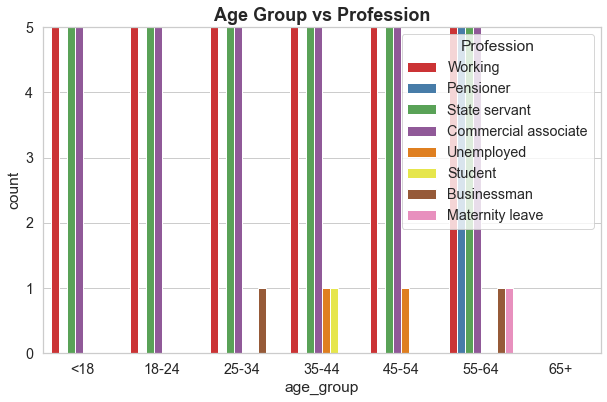

In [966]:
fig,ax =plt.subplots(figsize=(10,6),subplot_kw={'ylim':(0,5)})
sns.countplot(data = EDA_XYZBank_train,x = 'age_group', hue='Profession',palette='Set1')
plt.title('Age Group vs Profession',fontsize=18,fontweight="bold")

- __Observations__:
     - It can be infered from the above graph that **one customer aged above 55 is on maternity leave, one customer in the age group 35-44 is a student, two customers in the age group 25-34 and 55+ are Businessman, two       customers in the age group 35-44 and 45-54 who is unemployed** have applied for a loan in XYZ Bank.
      

Text(0.5, 1.0, 'Age Group vs Profession')

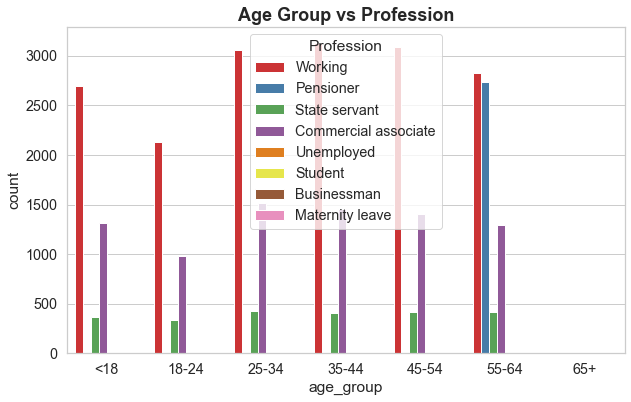

In [968]:
fig,ax =plt.subplots(figsize=(10,6))
sns.countplot(data = EDA_XYZBank_train,x = 'age_group', hue='Profession',palette='Set1')
plt.title('Age Group vs Profession',fontsize=18,fontweight="bold")

 - In the **age group less than 18, more than 2500 are working, more than 1200 are commercial associate, more than 250 are state servant.**
 - Customers who are **pensioners are more than 55 years of age.**
 - Customers with **High chances of applying for loan** who comes under working are from the **age 35 to 44 years.**
 - Customers who are **state servant** are applying for loan is **comparitively less compred to other profession.**

<a id=section3></a>
#### 5.1.2 What is the distribution of age group applying for loan?

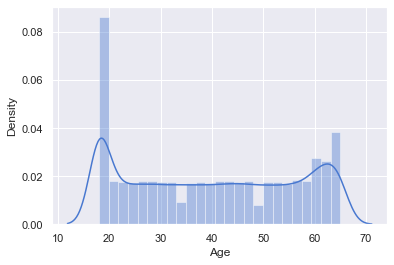

In [969]:
sns.set(color_codes=True)                                                # Plot a histogram of the respondents' ages (remove any NaN values)
sns.set_palette(sns.color_palette("muted"))

sns.distplot(XYZBank_loan_sanction_train["Age"]);

- __Observation :__
  - Most of the Customers applying for loan comes under the age 20 years followed by customers in the age 60+.

<a id=section3></a>
### 5.2 Analysis based on Gender

<a id=section3></a>
#### 5.2.1 Frequency of Male and Female applying for loan

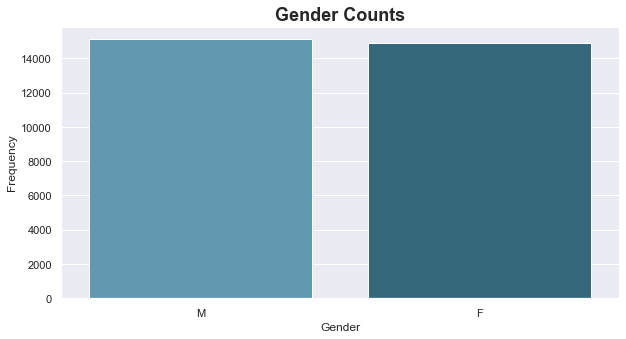

In [970]:
plt.figure(figsize=(10,5))
sns.countplot('Gender',data = EDA_XYZBank_train , order = EDA_XYZBank_train['Gender'].value_counts().index,palette="PuBuGn_d")
plt.title("Gender Counts",fontsize=18,fontweight="bold")
plt.xlabel('Gender')
plt.ylabel('Frequency')
plt.show()

- Ratio of Male and Female is nearly equal those applying for loan.

<a id=section3></a>
#### 5.2.2 Analysing Income stability based on Gender

Text(0.5, 1.0, 'Income Stability (Female)')

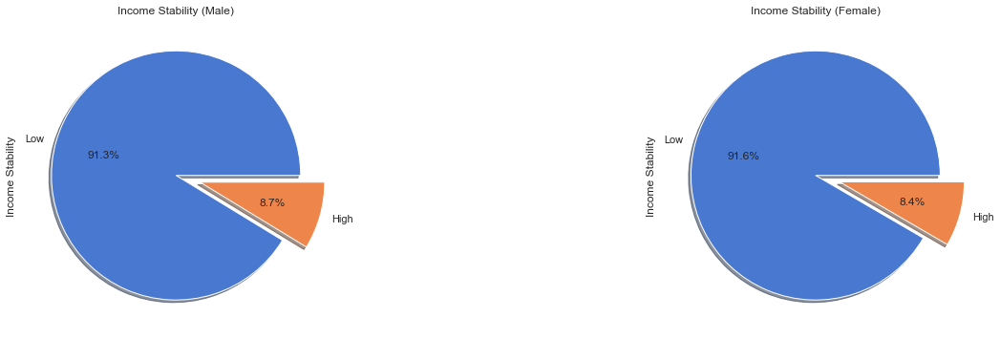

In [971]:
f,ax = plt.subplots(1,2,figsize=(22,6))
EDA_XYZBank_train['Income Stability'][EDA_XYZBank_train['Gender'] == 'M'].value_counts().plot.pie(explode=[0,0.2],autopct='%1.1f%%',ax=ax[0],shadow=True)
EDA_XYZBank_train['Income Stability'][EDA_XYZBank_train['Gender'] == 'F'].value_counts().plot.pie(explode=[0,0.2],autopct='%1.1f%%',ax=ax[1],shadow=True)

ax[0].set_title('Income Stability (Male)')
ax[1].set_title('Income Stability (Female)')

- __Observation :__
  - __Male__ has __Low Income Stabiity of 91.3%__ and __High Income Stability of 8.7%__.
  - __Female__ has __Low income stability of 91.6%__ and __High Income Stability of 8.4%__.
  - Thus, most of the customers have __Low Income Stability__.

<a id=section3></a>
#### 5.2.3 Which gender has more defaulters?

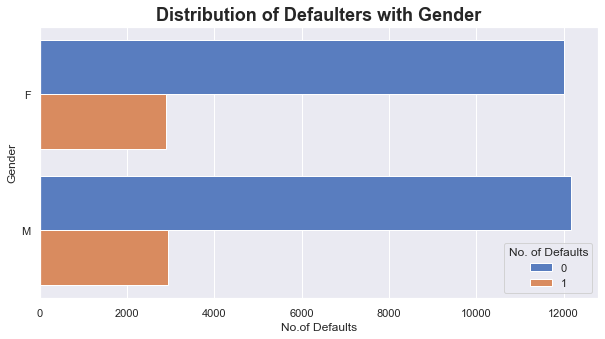

In [972]:
plt.figure(figsize=(10,5))
sns.countplot(y="Gender", hue="No. of Defaults", data=EDA_XYZBank_train)
plt.title("Distribution of Defaulters with Gender",fontsize=18,fontweight="bold")
plt.ylabel("Gender")
plt.xlabel("No.of Defaults")
plt.show()

- __Observation :__
  - __Male and Female are likely equal__ in the defaulters list.
  - __No.of non defaulters__ for __male is high__ than Female.

<a id=section3></a>
### 5.3 Analysis based on Customer's Location

<a id=section3></a>
#### 5.3.1 Analysing which location has more customers

Text(0.5, 1.0, 'Donut Plot showing the proportion of each location')

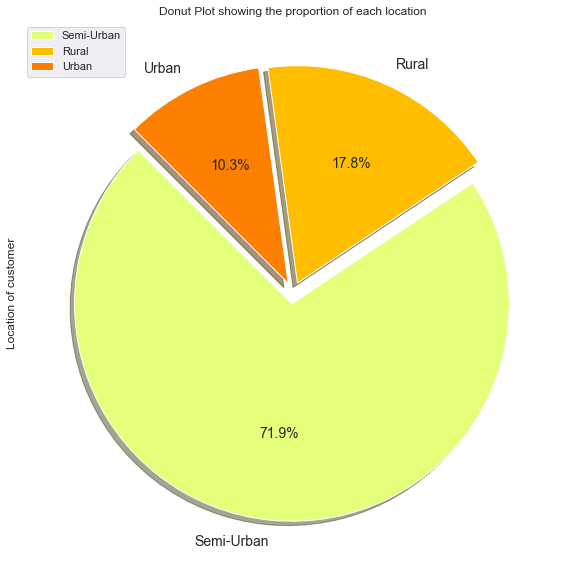

In [973]:
EDA_XYZBank_train['Location'].value_counts().plot(kind='pie', explode=[0.05,0.05,0.05], fontsize=14, autopct='%2.1f%%', 
                                               figsize=(10,10), shadow=True, startangle=135, legend=True, cmap='Wistia')

plt.ylabel('Location of customer')
plt.title('Donut Plot showing the proportion of each location')

- __Observation :__
  - __Majority__ of of the customers are from __Semi-Urban which leads to 71.9%__
  - __17.8% customers are from Rural__.
  - __10.3% of customers are from Urban__.

<a id=section3></a>
### 5.4 Analysis based on Property Location

<a id=section3></a>
#### 5.4.1 Which location has most number of properties who are taking loan?

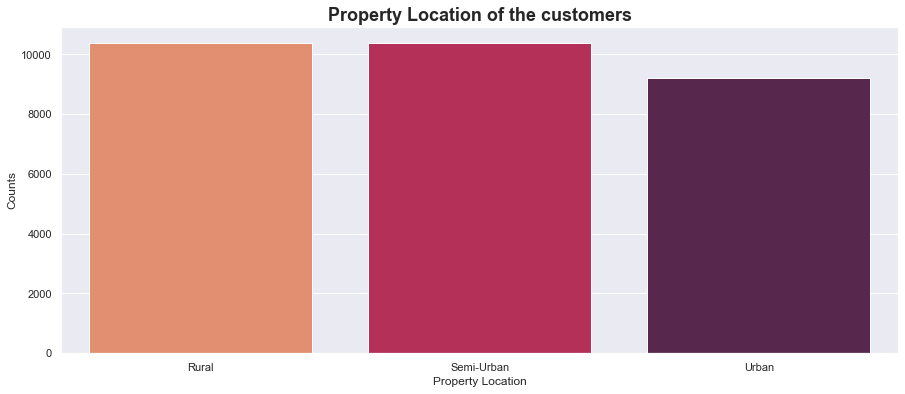

In [974]:
plt.figure(figsize=(15,6))
sns.countplot('Property Location',data = EDA_XYZBank_train, order = EDA_XYZBank_train['Property Location'].value_counts().index,palette="rocket_r")
plt.title("Property Location of the customers",fontsize=18,fontweight="bold")
plt.xlabel('Property Location')
plt.ylabel('Counts')
plt.show()

- __Observation :__
  - Location of the Customer's Property who has taken loan at XYZ Bank are plotted above.
  - Properties which are located in __Rural and Semi-Urban are more than 10000.__
  - Properties located in __Urban counts to 9000.__
 

<a id=section3></a>
### 5.5 Analysis based on Dependents

<a id=section3></a>
#### 5.5.1 How many dependents does the customers have who are applying for loan?

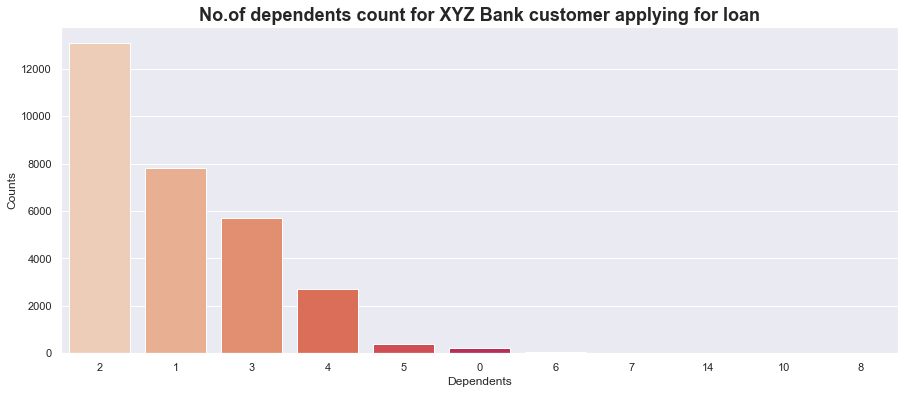

In [975]:
plt.figure(figsize=(15,6))
sns.countplot('Dependents',data = EDA_XYZBank_train, order = EDA_XYZBank_train['Dependents'].value_counts().index,palette="rocket_r")
plt.title("No.of dependents count for XYZ Bank customer applying for loan",fontsize=18,fontweight="bold")
plt.xlabel('Dependents')
plt.ylabel('Counts')
plt.show()

- __Observations:__
  - Customers applying for loan with __dependents count as 2 are nearly 13000 in XYZ Bank.__
  - More than __7500 customers have 1 dependent.__
  - More than __5500 customers have 3 dependents.__
  - Customers having __4 dependents are more than 2000.__
  - __Only few customers have dependents as 5 and 0.__

<a id=section3></a>
### 5.6 Correlation Map

Text(0.5, 1.0, 'Correlation between features')

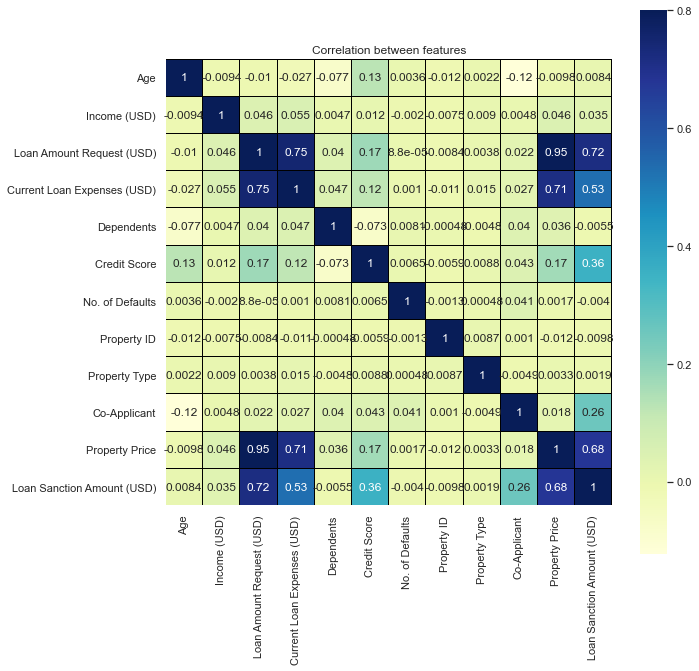

In [976]:
corr = EDA_XYZBank_train.corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black')
plt.title('Correlation between features')

- __Observations:__
  - Property Price and Loan Amount Request(USD) is highly correlated(0.95), high correlation leads to redundancy.
  - So, to avoid redundancy drop the column Property Price.

In [977]:
XYZBank_loan_sanction_train = XYZBank_loan_sanction_train.drop(['Property Price'],axis =1)
XYZBank_loan_sanction_train

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,N,N,3,809.440000,0,Unpossessed,746,4,Rural,1,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,N,Y,1,780.400000,0,Unpossessed,608,2,Rural,1,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,N,Y,1,833.150000,0,Unpossessed,546,2,Urban,0,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,N,Y,2,832.700000,1,Unpossessed,890,2,Semi-Urban,1,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,N,Y,1,745.550000,1,Active,715,4,Semi-Urban,1,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,M,38,4969.410000,Low,Commercial associate,Urban,76657.90,722.34,Y,Y,2,869.610000,0,Unpossessed,566,4,Urban,1,68992.11
29996,C-32511,M,20,1606.880000,Low,Working,Semi-Urban,66595.14,253.04,N,N,3,729.410000,0,Inactive,175,3,Urban,1,46616.60
29997,C-5192,F,49,2630.574417,Low,Working,Urban,81410.08,583.11,N,Y,1,739.885381,0,Active,959,1,Rural,1,61057.56
29998,C-12172,M,38,2417.710000,Low,Working,Semi-Urban,142524.10,378.29,N,Y,3,677.270000,1,Unpossessed,375,4,Urban,1,99766.87


Text(0.5, 1.0, 'Correlation between features')

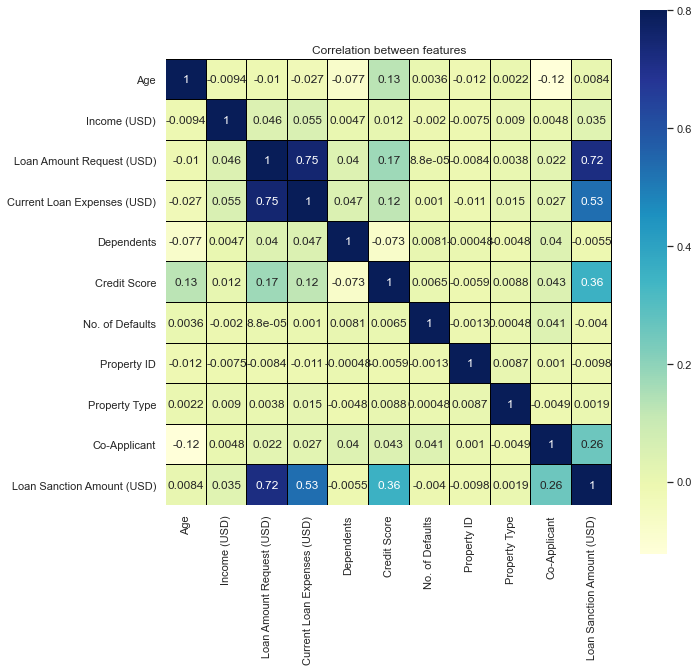

In [978]:
corr = XYZBank_loan_sanction_train.corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr,vmax=.8,linewidth=.01, square = True, annot = True,cmap='YlGnBu',linecolor ='black')
plt.title('Correlation between features')

- Dropping the column Expense Type 1, Expense Type 2, Property Id

In [979]:
XYZBank_loan_sanction_train = XYZBank_loan_sanction_train.drop(['Expense Type 1','Expense Type 2','Property ID'],axis =1)
XYZBank_loan_sanction_train

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property Type,Property Location,Co-Applicant,Loan Sanction Amount (USD)
0,C-36995,F,56,1933.050000,Low,Working,Semi-Urban,72809.58,241.08,3,809.440000,0,Unpossessed,4,Rural,1,54607.18
1,C-33999,M,32,4952.910000,Low,Working,Semi-Urban,46837.47,495.81,1,780.400000,0,Unpossessed,2,Rural,1,37469.98
2,C-3770,F,65,988.190000,High,Pensioner,Semi-Urban,45593.04,171.95,1,833.150000,0,Unpossessed,2,Urban,0,36474.43
3,C-26480,F,65,2630.574417,High,Pensioner,Rural,80057.92,298.54,2,832.700000,1,Unpossessed,2,Semi-Urban,1,56040.54
4,C-23459,F,31,2614.770000,Low,Working,Semi-Urban,113858.89,491.41,1,745.550000,1,Active,4,Semi-Urban,1,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,M,38,4969.410000,Low,Commercial associate,Urban,76657.90,722.34,2,869.610000,0,Unpossessed,4,Urban,1,68992.11
29996,C-32511,M,20,1606.880000,Low,Working,Semi-Urban,66595.14,253.04,3,729.410000,0,Inactive,3,Urban,1,46616.60
29997,C-5192,F,49,2630.574417,Low,Working,Urban,81410.08,583.11,1,739.885381,0,Active,1,Rural,1,61057.56
29998,C-12172,M,38,2417.710000,Low,Working,Semi-Urban,142524.10,378.29,3,677.270000,1,Unpossessed,4,Urban,1,99766.87


- **Grouping** 
  - Consolidate the profession variable into the following categories
  - Working
  - Pensioner
  - Unemployed

In [980]:
#Select unique elements
Profession = XYZBank_loan_sanction_train['Profession'].unique()
Profession

array(['Working', 'Pensioner', 'State servant', 'Commercial associate',
       'Unemployed', 'Student', 'Businessman', 'Maternity leave'],
      dtype=object)

In [982]:

#Select unique elements
profession = XYZBank_loan_sanction_train['Profession'].unique()

#Making groups
working_str = ["Working","State servant","Commercial associate","Businessman","Maternity leave"]
unemployed_str = ["Unemployed","Student"]           
pensioner_str = ["Pensioner"]

for (row, col) in XYZBank_loan_sanction_train.iterrows():

    if str(col.Profession) in working_str:
        XYZBank_loan_sanction_train['Profession'].replace(to_replace=col.Profession, value='Working', inplace=True)

    if str(col.Profession) in unemployed_str:
        XYZBank_loan_sanction_train['Profession'].replace(to_replace=col.Profession, value='Unemployed', inplace=True)

    if str(col.Profession) in pensioner_str:
        XYZBank_loan_sanction_train['Profession'].replace(to_replace=col.Profession, value='Pensioner', inplace=True)


print(XYZBank_loan_sanction_train['Profession'].unique())

['Working' 'Pensioner' 'Unemployed']


- Dummifying the columns Gender, Income Stability, Profession, Has Active Credit card, Property Location

In [983]:
XYZBank_loan_sanction_train = pd.get_dummies(XYZBank_loan_sanction_train, columns =['Gender','Income Stability','Profession','Location','Has Active Credit Card','Property Location'],drop_first = True)

In [984]:
list(XYZBank_loan_sanction_train.columns)

['Customer ID',
 'Age',
 'Income (USD)',
 'Loan Amount Request (USD)',
 'Current Loan Expenses (USD)',
 'Dependents',
 'Credit Score',
 'No. of Defaults',
 'Property Type',
 'Co-Applicant',
 'Loan Sanction Amount (USD)',
 'Gender_M',
 'Income Stability_Low',
 'Profession_Unemployed',
 'Profession_Working',
 'Location_Semi-Urban',
 'Location_Urban',
 'Has Active Credit Card_Inactive',
 'Has Active Credit Card_Unpossessed',
 'Property Location_Semi-Urban',
 'Property Location_Urban']

In [985]:
XYZBankcolumn_names = ['Gender_M','Age','Income (USD)','Income Stability_Low','Profession_Unemployed','Profession_Working','Location_Semi-Urban','Location_Urban','Loan Amount Request (USD)','Current Loan Expenses (USD)','Dependents','Credit Score','No. of Defaults','Has Active Credit Card_Inactive','Has Active Credit Card_Unpossessed','Property Type','Property Location_Semi-Urban','Property Location_Urban','Co-Applicant','Loan Sanction Amount (USD)']
XYZBank_loan_sanction_train = XYZBank_loan_sanction_train.reindex(columns=XYZBankcolumn_names)
print(XYZBank_loan_sanction_train)

       Gender_M  Age  Income (USD)  Income Stability_Low  \
0      0         56   1933.050000   1                      
1      1         32   4952.910000   1                      
2      0         65   988.190000    0                      
3      0         65   2630.574417   0                      
4      0         31   2614.770000   1                      
...   ..         ..           ...  ..                      
29995  1         38   4969.410000   1                      
29996  1         20   1606.880000   1                      
29997  0         49   2630.574417   1                      
29998  1         38   2417.710000   1                      
29999  0         63   3068.240000   0                      

       Profession_Unemployed  Profession_Working  Location_Semi-Urban  \
0      0                      1                   1                     
1      0                      1                   1                     
2      0                      0                   1         

In [986]:
XYZBank_loan_sanction_train.head()

,Gender_M,Age,Income (USD),Income Stability_Low,Profession_Unemployed,Profession_Working,Location_Semi-Urban,Location_Urban,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card_Inactive,Has Active Credit Card_Unpossessed,Property Type,Property Location_Semi-Urban,Property Location_Urban,Co-Applicant,Loan Sanction Amount (USD)
0,0,56,1933.050000,1,0,1,1,0,72809.58,241.08,3,809.44,0,0,1,4,0,0,1,54607.18
1,1,32,4952.910000,1,0,1,1,0,46837.47,495.81,1,780.40,0,0,1,2,0,0,1,37469.98
2,0,65,988.190000,0,0,0,1,0,45593.04,171.95,1,833.15,0,0,1,2,0,1,0,36474.43
3,0,65,2630.574417,0,0,0,0,0,80057.92,298.54,2,832.70,1,0,1,2,1,0,1,56040.54
4,0,31,2614.770000,1,0,1,1,0,113858.89,491.41,1,745.55,1,0,0,4,1,0,1,74008.28


In [987]:
XYZBank_loan_sanction_train.isnull().sum()

Gender_M                              0
Age                                   0
Income (USD)                          0
Income Stability_Low                  0
Profession_Unemployed                 0
Profession_Working                    0
Location_Semi-Urban                   0
Location_Urban                        0
Loan Amount Request (USD)             0
Current Loan Expenses (USD)           0
Dependents                            0
Credit Score                          0
No. of Defaults                       0
Has Active Credit Card_Inactive       0
Has Active Credit Card_Unpossessed    0
Property Type                         0
Property Location_Semi-Urban          0
Property Location_Urban               0
Co-Applicant                          0
Loan Sanction Amount (USD)            0
dtype: int64

<a id=section3></a>
## 6. Loading Test Data

In [988]:
XYZBank_loan_sanction_test = pd.read_csv(r'C:/Users/VINODA VARSHINI/Documents/HackerEarth/CiplaJune19th2021/dataset/test.csv')
XYZBank_loan_sanction_test

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
0,C-26247,Tandra Olszewski,F,47,3472.69,Low,Commercial associate,Managers,Semi-Urban,137088.98,396.72,N,N,2.0,799.14,0,Unpossessed,843,3472.69,2,Urban,1,236644.5
1,C-35067,Jeannette Cha,F,57,1184.84,Low,Working,Sales staff,Rural,104771.59,463.76,Y,Y,2.0,833.31,0,Unpossessed,22,1184.84,1,Rural,1,142357.3
2,C-34590,Keva Godfrey,F,52,1266.27,Low,Working,NaN,Semi-Urban,176684.91,493.15,N,Y,3.0,627.44,0,Unpossessed,1,1266.27,1,Urban,1,300991.24
3,C-16668,Elva Sackett,M,65,1369.72,High,Pensioner,NaN,Rural,97009.18,446.15,N,Y,2.0,833.20,0,Inactive,730,1369.72,1,Semi-Urban,0,125612.1
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,NaN,Urban,109980.00,370.10,N,N,NaN,NaN,0,NaN,356,1939.23,4,Semi-Urban,1,180908.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,Tobias Davilla,F,19,1349.60,Low,Commercial associate,NaN,Semi-Urban,156766.97,500.59,Y,Y,4.0,684.32,0,Inactive,681,1349.60,4,Semi-Urban,1,212778.0
19996,C-17587,Evelina Hodges,M,22,2019.78,Low,Working,Core staff,Urban,47924.80,243.02,Y,Y,NaN,706.34,0,Inactive,213,2019.78,4,Urban,1,90816.95
19997,C-46479,Karlyn Mckinzie,M,19,2252.03,Low,Working,Core staff,Semi-Urban,18629.88,101.88,Y,N,1.0,656.46,0,Inactive,270,2252.03,2,Rural,0,21566.27
19998,C-3099,Mariana Pulver,F,21,1845.35,Low,Working,NaN,Semi-Urban,95430.73,271.31,N,Y,2.0,865.46,0,Unpossessed,489,1845.35,1,Semi-Urban,1,120281.17


In [989]:
XYZBank_loan_sanction_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 23 columns):
Customer ID                    20000 non-null object
Name                           20000 non-null object
Gender                         19969 non-null object
Age                            20000 non-null int64
Income (USD)                   19250 non-null float64
Income Stability               19187 non-null object
Profession                     20000 non-null object
Type of Employment             15311 non-null object
Location                       20000 non-null object
Loan Amount Request (USD)      20000 non-null float64
Current Loan Expenses (USD)    19917 non-null float64
Expense Type 1                 20000 non-null object
Expense Type 2                 20000 non-null object
Dependents                     18858 non-null float64
Credit Score                   19257 non-null float64
No. of Defaults                20000 non-null int64
Has Active Credit Card         18924 non

In [990]:
XYZBank_loan_sanction_test.describe(include = 'all')

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
count,20000,20000,19969,20000.000000,19250.000000,19187,20000,15311,20000,20000.000000,19917.000000,20000,20000,18858.000000,19257.000000,20000.000000,18924,20000.000000,19108.000000,20000.00000,19840,20000,20000
unique,20000,20000,2,NaN,NaN,2,7,18,3,NaN,NaN,2,2,NaN,NaN,NaN,3,NaN,NaN,NaN,3,3,19824
top,C-42774,Nilda Judd,F,NaN,NaN,Low,Working,Laborers,Semi-Urban,NaN,NaN,N,Y,NaN,NaN,NaN,Active,NaN,NaN,NaN,Semi-Urban,1,?
freq,1,1,10142,NaN,NaN,17501,11405,3743,14463,NaN,NaN,12816,13383,NaN,NaN,NaN,6418,NaN,NaN,NaN,6839,17004,168
mean,NaN,NaN,NaN,39.940500,2536.995394,NaN,NaN,NaN,NaN,88859.076706,408.462359,NaN,NaN,2.251246,738.821538,0.189500,NaN,501.024500,2534.102003,2.47190,NaN,NaN,NaN
std,NaN,NaN,NaN,16.097618,1415.908803,NaN,NaN,NaN,NaN,60007.333673,215.846532,NaN,NaN,0.953153,72.406504,0.391915,NaN,287.537722,1408.509255,1.12551,NaN,NaN,NaN
min,NaN,NaN,NaN,18.000000,368.590000,NaN,NaN,NaN,NaN,6185.480000,41.370000,NaN,NaN,1.000000,580.040000,0.000000,NaN,1.000000,368.590000,1.00000,NaN,NaN,NaN
25%,NaN,NaN,NaN,25.000000,1659.722500,NaN,NaN,NaN,NaN,40889.030000,250.890000,NaN,NaN,2.000000,680.300000,0.000000,NaN,252.000000,1658.397500,1.00000,NaN,NaN,NaN
50%,NaN,NaN,NaN,40.000000,2224.590000,NaN,NaN,NaN,NaN,74565.990000,374.000000,NaN,NaN,2.000000,739.300000,0.000000,NaN,501.000000,2220.605000,2.00000,NaN,NaN,NaN
75%,NaN,NaN,NaN,55.000000,3082.925000,NaN,NaN,NaN,NaN,120068.852500,519.570000,NaN,NaN,3.000000,797.440000,0.000000,NaN,748.000000,3082.250000,3.00000,NaN,NaN,NaN


In [991]:
XYZBank_loan_sanction_test.isnull().sum()

Customer ID                    0   
Name                           0   
Gender                         31  
Age                            0   
Income (USD)                   750 
Income Stability               813 
Profession                     0   
Type of Employment             4689
Location                       0   
Loan Amount Request (USD)      0   
Current Loan Expenses (USD)    83  
Expense Type 1                 0   
Expense Type 2                 0   
Dependents                     1142
Credit Score                   743 
No. of Defaults                0   
Has Active Credit Card         1076
Property ID                    0   
Property Age                   892 
Property Type                  0   
Property Location              160 
Co-Applicant                   0   
Property Price                 0   
dtype: int64

<a id=section301></a>
### 6.1 Pandas Profiling before Data Preprocessing for test data

In [78]:
profile_test = ProfileReport(XYZBank_loan_sanction_test,title='Pandas Profiling before Data Preprocessing for test data')
profile_test

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [79]:
profile_test.to_file("XYZ_trainreport_test.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

- __Observations:__
  - In the test dataset the below mentioned details are observed
  - There is a __high correlation of Income (USD) and property Age.__
  - __Income (USD) has (3.8%) missing values.__
  - __Income Stability has (4.1%) missing values.__
  - __Type of Employment has (23.4%) missing values.__
  - __Dependents has (5.7%) missing values.__
  - __Credit score has (3.7%) missing values.__
  - __Has Active Credit Card has (5.4%) missing values.__
  

<a id=section3></a>
## 6.2. Data Preprocessing

<a id=section3></a>
#### 6.2.1. Handling Missing values in train dataset

In [992]:
XYZBank_loan_sanction_test['Gender'].value_counts()

F    10142
M    9827 
Name: Gender, dtype: int64

In [993]:
XYZBank_loan_sanction_test[XYZBank_loan_sanction_test ['Gender'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
1317,C-36141,Karoline Rakestraw,NaN,34,2682.15,Low,State servant,Core staff,Semi-Urban,33441.46,326.40,N,Y,3.0,744.34,0,Active,348,2682.15,4,Urban,1,43390.04
3119,C-38137,Desire Dalzell,NaN,39,1919.97,Low,Working,Security staff,Rural,54363.85,326.37,Y,Y,4.0,675.21,0,Active,829,1919.97,4,Semi-Urban,1,61637.25
3808,C-3143,Myrtice Lamantia,NaN,36,3424.07,Low,Working,High skill tech staff,Semi-Urban,262526.19,666.50,Y,Y,3.0,783.89,1,Inactive,913,3424.07,4,Rural,1,482267.5
4650,C-7172,Ming Prigge,NaN,56,3155.12,Low,Working,NaN,Semi-Urban,65012.29,336.59,Y,Y,4.0,714.75,1,Unpossessed,888,3155.12,1,Urban,1,89393.03
5183,C-47929,Tatyana Conard,NaN,54,3109.85,Low,Working,Security staff,Semi-Urban,133242.61,513.98,Y,Y,1.0,760.12,1,Unpossessed,941,3109.85,1,Rural,0,226324.82
6767,C-38586,Marylee Verrett,NaN,54,1094.39,Low,Working,Core staff,Rural,150741.19,368.07,N,Y,2.0,791.82,0,NaN,756,1094.39,3,Rural,1,239523.2
7737,C-46039,Jani May,NaN,59,6402.51,Low,Working,Managers,Semi-Urban,57409.26,451.05,Y,Y,2.0,680.01,1,Unpossessed,974,6402.51,4,Urban,0,83338.65
8043,C-16684,Dian Kanagy,NaN,52,1755.72,Low,Working,Laborers,Semi-Urban,23104.62,112.84,N,Y,1.0,716.33,0,Inactive,117,1755.72,3,Semi-Urban,1,33962.57
8425,C-27759,Leonel Payer,NaN,55,3511.45,Low,Working,Laborers,Semi-Urban,80144.32,388.34,Y,N,3.0,723.19,0,Inactive,599,3511.45,1,Rural,1,93007.78
8839,C-14980,Erich Solt,NaN,43,2003.87,Low,Commercial associate,Managers,Semi-Urban,45080.10,305.38,Y,Y,2.0,734.95,0,Inactive,65,2003.87,3,Rural,1,52356.83


In [994]:
XYZBank_loan_sanction_test['Gender'].fillna('F',inplace = True)

- __Handling missing values in Dependents Column:__

In [995]:
XYZBank_loan_sanction_test[XYZBank_loan_sanction_test ['Dependents'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,NaN,Urban,109980.00,370.10,N,N,NaN,NaN,0,NaN,356,1939.23,4,Semi-Urban,1,180908.0
10,C-3624,Kerri Mccool,F,43,2037.14,Low,Commercial associate,Core staff,Rural,123472.08,350.99,N,Y,NaN,NaN,1,Active,988,2037.14,4,Rural,1,212239.85
42,C-17501,Janelle Paolucci,F,41,2108.91,Low,Commercial associate,Secretaries,Semi-Urban,63645.36,335.37,N,Y,NaN,866.69,1,Active,684,2108.91,4,Rural,1,91555.28
44,C-8590,Mellissa Aponte,F,18,4362.74,Low,Working,Sales staff,Semi-Urban,160999.64,1675.32,Y,Y,NaN,830.80,1,Unpossessed,483,4362.74,1,Rural,1,220414.9
126,C-16139,Bridget Gebo,M,22,1934.10,Low,Working,High skill tech staff,Semi-Urban,30415.32,132.84,N,Y,NaN,760.32,0,Active,972,1934.10,3,Rural,1,44876.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19768,C-7498,Selina Chynoweth,F,40,4945.61,Low,Working,Managers,Semi-Urban,32736.84,289.23,Y,Y,NaN,806.89,0,NaN,366,4945.61,3,Semi-Urban,1,36290.92
19821,C-36,Carmina Gallaway,F,23,1621.49,Low,Working,NaN,Semi-Urban,79596.07,390.24,N,N,NaN,709.85,0,Inactive,684,1621.49,4,Rural,1,115579.14
19829,C-11720,Libbie Bumbalough,F,40,1662.24,Low,Working,Medicine staff,Semi-Urban,15875.45,159.16,N,Y,NaN,712.63,0,Unpossessed,720,1662.24,4,Rural,1,25680.09
19970,C-10700,Enola Sorrels,F,30,2371.54,NaN,Working,NaN,Semi-Urban,20740.09,210.17,Y,Y,NaN,671.50,0,Inactive,303,2371.54,4,NaN,1,37954.22


In [996]:
XYZBank_loan_sanction_train['Co-Applicant'].value_counts(sort=True)

1    25684
0    4316 
Name: Co-Applicant, dtype: int64

In [997]:

XYZBank_loan_sanction_test['Co-Applicant'].unique()

array(['1', '0', '?'], dtype=object)

In [998]:
XYZBank_loan_sanction_test.replace({'Co-Applicant':{'?':'0'}},inplace = True)     # Replacing ? with 0

In [999]:
XYZBank_loan_sanction_test['Dependents'].unique()

array([ 2.,  3., nan,  1.,  4.,  5.,  6.,  7., 13., 10.,  8.])

In [1000]:
XYZBank_loan_sanction_test['Dependents'].fillna(XYZBank_loan_sanction_test['Co-Applicant'],inplace = True) 

In [1001]:
XYZBank_loan_sanction_test['Dependents'].value_counts(sort=True)

2.0     8951
3.0     3874
1.0     3843
4.0     1915
1       1031
5.0     245 
0       111 
6.0     21  
8.0     4   
7.0     3   
13.0    1   
10.0    1   
Name: Dependents, dtype: int64

In [1002]:
XYZBank_loan_sanction_train['Dependents'] = XYZBank_loan_sanction_train['Dependents'].apply(np.floor).astype(int)
XYZBank_loan_sanction_train.head()

,Gender_M,Age,Income (USD),Income Stability_Low,Profession_Unemployed,Profession_Working,Location_Semi-Urban,Location_Urban,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card_Inactive,Has Active Credit Card_Unpossessed,Property Type,Property Location_Semi-Urban,Property Location_Urban,Co-Applicant,Loan Sanction Amount (USD)
0,0,56,1933.050000,1,0,1,1,0,72809.58,241.08,3,809.44,0,0,1,4,0,0,1,54607.18
1,1,32,4952.910000,1,0,1,1,0,46837.47,495.81,1,780.40,0,0,1,2,0,0,1,37469.98
2,0,65,988.190000,0,0,0,1,0,45593.04,171.95,1,833.15,0,0,1,2,0,1,0,36474.43
3,0,65,2630.574417,0,0,0,0,0,80057.92,298.54,2,832.70,1,0,1,2,1,0,1,56040.54
4,0,31,2614.770000,1,0,1,1,0,113858.89,491.41,1,745.55,1,0,0,4,1,0,1,74008.28


In [1003]:
XYZBank_loan_sanction_train['Co-Applicant'] = XYZBank_loan_sanction_train['Co-Applicant'].apply(np.floor).astype(int)
XYZBank_loan_sanction_train.head()

,Gender_M,Age,Income (USD),Income Stability_Low,Profession_Unemployed,Profession_Working,Location_Semi-Urban,Location_Urban,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card_Inactive,Has Active Credit Card_Unpossessed,Property Type,Property Location_Semi-Urban,Property Location_Urban,Co-Applicant,Loan Sanction Amount (USD)
0,0,56,1933.050000,1,0,1,1,0,72809.58,241.08,3,809.44,0,0,1,4,0,0,1,54607.18
1,1,32,4952.910000,1,0,1,1,0,46837.47,495.81,1,780.40,0,0,1,2,0,0,1,37469.98
2,0,65,988.190000,0,0,0,1,0,45593.04,171.95,1,833.15,0,0,1,2,0,1,0,36474.43
3,0,65,2630.574417,0,0,0,0,0,80057.92,298.54,2,832.70,1,0,1,2,1,0,1,56040.54
4,0,31,2614.770000,1,0,1,1,0,113858.89,491.41,1,745.55,1,0,0,4,1,0,1,74008.28


In [1004]:
XYZBank_loan_sanction_test['Profession'][XYZBank_loan_sanction_test['Income (USD)'].isna()].unique()

array(['Working', 'Commercial associate', 'State servant', 'Pensioner'],
      dtype=object)

In [1005]:
XYZBank_loan_sanction_test['Income (USD)'].fillna(XYZBank_loan_sanction_test['Income (USD)'].mean(),inplace=True)
XYZBank_loan_sanction_test.head(100)

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
0,C-26247,Tandra Olszewski,F,47,3472.69,Low,Commercial associate,Managers,Semi-Urban,137088.98,396.72,N,N,2,799.14,0,Unpossessed,843,3472.69,2,Urban,1,236644.5
1,C-35067,Jeannette Cha,F,57,1184.84,Low,Working,Sales staff,Rural,104771.59,463.76,Y,Y,2,833.31,0,Unpossessed,22,1184.84,1,Rural,1,142357.3
2,C-34590,Keva Godfrey,F,52,1266.27,Low,Working,NaN,Semi-Urban,176684.91,493.15,N,Y,3,627.44,0,Unpossessed,1,1266.27,1,Urban,1,300991.24
3,C-16668,Elva Sackett,M,65,1369.72,High,Pensioner,NaN,Rural,97009.18,446.15,N,Y,2,833.20,0,Inactive,730,1369.72,1,Semi-Urban,0,125612.1
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,NaN,Urban,109980.00,370.10,N,N,1,NaN,0,NaN,356,1939.23,4,Semi-Urban,1,180908.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-43113,Ming Libbey,F,23,2074.75,Low,Working,Secretaries,Rural,63473.60,306.65,N,N,2,690.69,0,Active,827,2074.75,3,Urban,1,92847.41
96,C-27336,Desire Goodson,M,38,2035.81,Low,Working,Security staff,Semi-Urban,129400.28,562.32,Y,Y,2,806.34,1,Unpossessed,689,2035.81,3,Rural,1,211897.6
97,C-36772,Nolan Drewry,M,33,2439.78,Low,Commercial associate,High skill tech staff,Rural,66551.42,365.87,N,Y,2,739.47,0,Unpossessed,912,2439.78,2,Rural,1,83117.73
98,C-3197,Rufus Chi,M,44,2326.88,Low,Commercial associate,Laborers,Semi-Urban,16263.39,167.09,N,Y,2,668.53,0,Active,154,2326.88,1,Rural,1,28795.99


In [1006]:
XYZBank_loan_sanction_test['Credit Score'].fillna(XYZBank_loan_sanction_test['Credit Score'].mean(),inplace=True)
XYZBank_loan_sanction_test.head(100)

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
0,C-26247,Tandra Olszewski,F,47,3472.69,Low,Commercial associate,Managers,Semi-Urban,137088.98,396.72,N,N,2,799.140000,0,Unpossessed,843,3472.69,2,Urban,1,236644.5
1,C-35067,Jeannette Cha,F,57,1184.84,Low,Working,Sales staff,Rural,104771.59,463.76,Y,Y,2,833.310000,0,Unpossessed,22,1184.84,1,Rural,1,142357.3
2,C-34590,Keva Godfrey,F,52,1266.27,Low,Working,NaN,Semi-Urban,176684.91,493.15,N,Y,3,627.440000,0,Unpossessed,1,1266.27,1,Urban,1,300991.24
3,C-16668,Elva Sackett,M,65,1369.72,High,Pensioner,NaN,Rural,97009.18,446.15,N,Y,2,833.200000,0,Inactive,730,1369.72,1,Semi-Urban,0,125612.1
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,NaN,Urban,109980.00,370.10,N,N,1,738.821538,0,NaN,356,1939.23,4,Semi-Urban,1,180908.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-43113,Ming Libbey,F,23,2074.75,Low,Working,Secretaries,Rural,63473.60,306.65,N,N,2,690.690000,0,Active,827,2074.75,3,Urban,1,92847.41
96,C-27336,Desire Goodson,M,38,2035.81,Low,Working,Security staff,Semi-Urban,129400.28,562.32,Y,Y,2,806.340000,1,Unpossessed,689,2035.81,3,Rural,1,211897.6
97,C-36772,Nolan Drewry,M,33,2439.78,Low,Commercial associate,High skill tech staff,Rural,66551.42,365.87,N,Y,2,739.470000,0,Unpossessed,912,2439.78,2,Rural,1,83117.73
98,C-3197,Rufus Chi,M,44,2326.88,Low,Commercial associate,Laborers,Semi-Urban,16263.39,167.09,N,Y,2,668.530000,0,Active,154,2326.88,1,Rural,1,28795.99


In [1007]:
XYZBank_loan_sanction_test[XYZBank_loan_sanction_test['Current Loan Expenses (USD)'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
367,C-15887,Nana Ankrom,F,18,908.25,NaN,Working,High skill tech staff,Rural,107818.31,NaN,Y,Y,4,642.96,0,Inactive,335,908.25,2,Urban,1,173726.56
511,C-19163,Brinda Meadow,M,26,3354.66,Low,State servant,Laborers,Semi-Urban,264347.52,NaN,N,Y,2,740.34,1,Inactive,856,3354.66,2,Urban,1,?
690,C-10753,Neoma Koeppel,F,53,1883.60,Low,Working,Drivers,Rural,71487.91,NaN,Y,N,2,620.94,0,Inactive,245,1883.60,3,Semi-Urban,1,91166.59
1664,C-5608,Alethia Warfield,F,21,1052.35,Low,Working,Sales staff,Rural,112937.73,NaN,N,N,3,635.69,0,Active,718,1052.35,2,Urban,1,174442.19
2247,C-14680,Vera Antoine,M,65,1357.98,High,Pensioner,NaN,Semi-Urban,144248.31,NaN,N,Y,1,801.37,0,Inactive,884,1357.98,1,Urban,1,226492.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17161,C-10106,Marylee Wilczynski,F,36,2802.77,NaN,Working,Core staff,Semi-Urban,113605.99,NaN,Y,Y,2,681.51,1,Unpossessed,756,2802.77,3,Rural,1,215145.53
18718,C-7353,Enid Izaguirre,F,42,1716.84,Low,Working,Laborers,Urban,47865.66,NaN,N,N,2,653.81,0,Active,791,1716.84,1,Rural,1,59355.58
19794,C-3228,Codi Ray,M,53,994.45,Low,State servant,Core staff,Rural,70367.71,NaN,N,Y,4,732.02,0,Inactive,709,994.45,1,Semi-Urban,1,110927.81
19891,C-12783,Enid Jerome,M,36,1817.07,Low,Working,Laborers,Semi-Urban,32812.28,NaN,Y,Y,1,810.95,0,Unpossessed,761,1817.07,1,Urban,1,46361.2


In [1008]:
XYZBank_loan_sanction_test['Current Loan Expenses (USD)'].fillna(XYZBank_loan_sanction_test['Current Loan Expenses (USD)'].mean(),inplace=True)
XYZBank_loan_sanction_test.head(100)

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
0,C-26247,Tandra Olszewski,F,47,3472.69,Low,Commercial associate,Managers,Semi-Urban,137088.98,396.72,N,N,2,799.140000,0,Unpossessed,843,3472.69,2,Urban,1,236644.5
1,C-35067,Jeannette Cha,F,57,1184.84,Low,Working,Sales staff,Rural,104771.59,463.76,Y,Y,2,833.310000,0,Unpossessed,22,1184.84,1,Rural,1,142357.3
2,C-34590,Keva Godfrey,F,52,1266.27,Low,Working,NaN,Semi-Urban,176684.91,493.15,N,Y,3,627.440000,0,Unpossessed,1,1266.27,1,Urban,1,300991.24
3,C-16668,Elva Sackett,M,65,1369.72,High,Pensioner,NaN,Rural,97009.18,446.15,N,Y,2,833.200000,0,Inactive,730,1369.72,1,Semi-Urban,0,125612.1
4,C-12196,Sade Constable,F,60,1939.23,High,Pensioner,NaN,Urban,109980.00,370.10,N,N,1,738.821538,0,NaN,356,1939.23,4,Semi-Urban,1,180908.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,C-43113,Ming Libbey,F,23,2074.75,Low,Working,Secretaries,Rural,63473.60,306.65,N,N,2,690.690000,0,Active,827,2074.75,3,Urban,1,92847.41
96,C-27336,Desire Goodson,M,38,2035.81,Low,Working,Security staff,Semi-Urban,129400.28,562.32,Y,Y,2,806.340000,1,Unpossessed,689,2035.81,3,Rural,1,211897.6
97,C-36772,Nolan Drewry,M,33,2439.78,Low,Commercial associate,High skill tech staff,Rural,66551.42,365.87,N,Y,2,739.470000,0,Unpossessed,912,2439.78,2,Rural,1,83117.73
98,C-3197,Rufus Chi,M,44,2326.88,Low,Commercial associate,Laborers,Semi-Urban,16263.39,167.09,N,Y,2,668.530000,0,Active,154,2326.88,1,Rural,1,28795.99


In [1009]:
XYZBank_loan_sanction_test['Income Stability'].value_counts()

Low     17501
High    1686 
Name: Income Stability, dtype: int64

In [1010]:
XYZBank_loan_sanction_test[XYZBank_loan_sanction_test['Income Stability'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
9,C-11606,Hellen Alexis,F,27,949.17,NaN,Working,Laborers,Rural,24703.89,188.92,N,Y,2,749.220000,0,Active,260,949.17,2,Semi-Urban,1,41387.23
12,C-15190,Shanae Irick,M,53,1227.59,NaN,Commercial associate,NaN,Urban,189855.86,514.26,N,Y,3,718.420000,0,Inactive,490,1227.59,4,Rural,1,336799.97
15,C-1281,Trinidad Quam,F,60,5591.39,NaN,Pensioner,NaN,Urban,251463.83,868.00,N,Y,1,851.870000,0,Active,686,5591.39,1,Semi-Urban,0,438663.7
32,C-11314,Rex Eynon,F,61,4078.15,NaN,Pensioner,NaN,Rural,98049.28,674.05,N,Y,2,840.760000,1,Inactive,814,4078.15,2,Rural,1,146792.78
83,C-9613,Tawana Tibbets,M,25,2142.07,NaN,State servant,Accountants,Semi-Urban,50063.21,208.84,Y,N,2,618.610000,0,Active,647,2142.07,3,Semi-Urban,0,76209.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19756,C-6605,Lakiesha Payer,M,28,2078.11,NaN,Working,Laborers,Semi-Urban,67088.56,323.24,N,Y,0,633.970000,0,Inactive,581,2078.11,2,Rural,0,98386.97
19790,C-11433,America Moats,F,63,8414.09,NaN,Pensioner,NaN,Urban,162203.46,838.60,N,Y,2,702.070000,0,Inactive,481,8414.09,2,Rural,0,296850.48
19806,C-17182,Corrine Saylors,M,62,3302.48,NaN,Working,Laborers,Semi-Urban,139954.97,703.94,Y,Y,2,738.821538,0,Active,828,3302.48,3,Rural,1,258103.54
19916,C-1802,Wiley Splawn,F,29,1856.81,NaN,Working,Drivers,Rural,111636.52,314.61,Y,Y,3,684.780000,1,Unpossessed,716,1856.81,3,Semi-Urban,1,166555.04


In [1011]:
XYZBank_loan_sanction_test['Income Stability'].fillna('Low',inplace = True)

In [1012]:
XYZBank_loan_sanction_test['Property Location'].value_counts()

Semi-Urban    6839
Rural         6768
Urban         6233
Name: Property Location, dtype: int64

In [1013]:
XYZBank_loan_sanction_test[XYZBank_loan_sanction_test['Property Location'].isna()]

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price
164,C-9405,Shona Ligon,M,51,1515.94,Low,Commercial associate,Laborers,Rural,120220.16,290.59,Y,N,2,800.500000,0,NaN,142,1515.94,2,NaN,1,187750.03
290,C-19884,Teri Miser,M,49,1539.91,Low,Working,NaN,Semi-Urban,37553.68,226.73,N,N,1,738.821538,0,Unpossessed,601,1539.91,3,NaN,1,60115.37
375,C-2852,Noe Cleary,F,18,2779.71,Low,Working,Laborers,Semi-Urban,67011.20,417.36,Y,Y,2,609.460000,0,Active,316,2779.71,2,NaN,1,99855.91
484,C-15736,Shawna Benjamin,M,22,2508.05,Low,Working,Core staff,Rural,35137.72,269.50,N,Y,3,741.650000,1,Active,983,2508.05,3,NaN,1,55638.79
540,C-19291,Carmelo Kanagy,M,48,925.27,Low,Working,Sales staff,Rural,41481.38,192.08,N,Y,3,734.400000,0,Inactive,879,925.27,1,NaN,1,53768.73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19561,C-13158,Lucio Propp,F,53,1963.52,Low,Commercial associate,Laborers,Urban,42163.01,203.66,N,Y,4,676.570000,0,Unpossessed,53,1963.52,1,NaN,1,58856.17
19594,C-14459,Nikki Houseknecht,F,63,559.07,High,Pensioner,NaN,Semi-Urban,37192.62,173.24,N,N,1,845.590000,0,Active,302,559.07,4,NaN,1,58918.56
19824,C-15192,Bert Wanner,M,57,2476.27,Low,Working,HR staff,Semi-Urban,18178.83,169.81,N,N,1,789.570000,0,Unpossessed,537,2476.27,2,NaN,1,31967.85
19861,C-8608,Lida Seger,M,42,2638.07,Low,Commercial associate,NaN,Urban,79788.45,438.46,N,N,2,614.600000,1,Inactive,985,2638.07,3,NaN,1,138588.09


In [1014]:
XYZBank_loan_sanction_test['Property Location'].fillna('Semi-Urban',inplace = True)

In [1015]:
XYZBank_loan_sanction_test['Has Active Credit Card'].value_counts()

Active         6418
Inactive       6376
Unpossessed    6130
Name: Has Active Credit Card, dtype: int64

In [1016]:
XYZBank_loan_sanction_test['Has Active Credit Card'].fillna('Active',inplace = True)

In [1017]:
XYZBank_loan_sanction_test = XYZBank_loan_sanction_test.drop(['Name','Type of Employment','Property Age','Property Price'],axis =1)
XYZBank_loan_sanction_test

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Expense Type 1,Expense Type 2,Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Type,Property Location,Co-Applicant
0,C-26247,F,47,3472.69,Low,Commercial associate,Semi-Urban,137088.98,396.72,N,N,2,799.140000,0,Unpossessed,843,2,Urban,1
1,C-35067,F,57,1184.84,Low,Working,Rural,104771.59,463.76,Y,Y,2,833.310000,0,Unpossessed,22,1,Rural,1
2,C-34590,F,52,1266.27,Low,Working,Semi-Urban,176684.91,493.15,N,Y,3,627.440000,0,Unpossessed,1,1,Urban,1
3,C-16668,M,65,1369.72,High,Pensioner,Rural,97009.18,446.15,N,Y,2,833.200000,0,Inactive,730,1,Semi-Urban,0
4,C-12196,F,60,1939.23,High,Pensioner,Urban,109980.00,370.10,N,N,1,738.821538,0,Active,356,4,Semi-Urban,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,F,19,1349.60,Low,Commercial associate,Semi-Urban,156766.97,500.59,Y,Y,4,684.320000,0,Inactive,681,4,Semi-Urban,1
19996,C-17587,M,22,2019.78,Low,Working,Urban,47924.80,243.02,Y,Y,1,706.340000,0,Inactive,213,4,Urban,1
19997,C-46479,M,19,2252.03,Low,Working,Semi-Urban,18629.88,101.88,Y,N,1,656.460000,0,Inactive,270,2,Rural,0
19998,C-3099,F,21,1845.35,Low,Working,Semi-Urban,95430.73,271.31,N,Y,2,865.460000,0,Unpossessed,489,1,Semi-Urban,1


In [1018]:
XYZBank_loan_sanction_test.isnull().sum()

Customer ID                    0
Gender                         0
Age                            0
Income (USD)                   0
Income Stability               0
Profession                     0
Location                       0
Loan Amount Request (USD)      0
Current Loan Expenses (USD)    0
Expense Type 1                 0
Expense Type 2                 0
Dependents                     0
Credit Score                   0
No. of Defaults                0
Has Active Credit Card         0
Property ID                    0
Property Type                  0
Property Location              0
Co-Applicant                   0
dtype: int64

In [1019]:
XYZBank_loan_sanction_test = XYZBank_loan_sanction_test.drop(['Expense Type 1','Expense Type 2','Property ID'],axis =1)
XYZBank_loan_sanction_test

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property Type,Property Location,Co-Applicant
0,C-26247,F,47,3472.69,Low,Commercial associate,Semi-Urban,137088.98,396.72,2,799.140000,0,Unpossessed,2,Urban,1
1,C-35067,F,57,1184.84,Low,Working,Rural,104771.59,463.76,2,833.310000,0,Unpossessed,1,Rural,1
2,C-34590,F,52,1266.27,Low,Working,Semi-Urban,176684.91,493.15,3,627.440000,0,Unpossessed,1,Urban,1
3,C-16668,M,65,1369.72,High,Pensioner,Rural,97009.18,446.15,2,833.200000,0,Inactive,1,Semi-Urban,0
4,C-12196,F,60,1939.23,High,Pensioner,Urban,109980.00,370.10,1,738.821538,0,Active,4,Semi-Urban,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,C-9076,F,19,1349.60,Low,Commercial associate,Semi-Urban,156766.97,500.59,4,684.320000,0,Inactive,4,Semi-Urban,1
19996,C-17587,M,22,2019.78,Low,Working,Urban,47924.80,243.02,1,706.340000,0,Inactive,4,Urban,1
19997,C-46479,M,19,2252.03,Low,Working,Semi-Urban,18629.88,101.88,1,656.460000,0,Inactive,2,Rural,0
19998,C-3099,F,21,1845.35,Low,Working,Semi-Urban,95430.73,271.31,2,865.460000,0,Unpossessed,1,Semi-Urban,1


- **Grouping** 
  - Consolidate the profession variable into the following categories
  - Working
  - Pensioner
  - Unemployed

In [1020]:
XYZBank_loan_sanction_test.head()

,Customer ID,Gender,Age,Income (USD),Income Stability,Profession,Location,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card,Property Type,Property Location,Co-Applicant
0,C-26247,F,47,3472.69,Low,Commercial associate,Semi-Urban,137088.98,396.72,2,799.140000,0,Unpossessed,2,Urban,1
1,C-35067,F,57,1184.84,Low,Working,Rural,104771.59,463.76,2,833.310000,0,Unpossessed,1,Rural,1
2,C-34590,F,52,1266.27,Low,Working,Semi-Urban,176684.91,493.15,3,627.440000,0,Unpossessed,1,Urban,1
3,C-16668,M,65,1369.72,High,Pensioner,Rural,97009.18,446.15,2,833.200000,0,Inactive,1,Semi-Urban,0
4,C-12196,F,60,1939.23,High,Pensioner,Urban,109980.00,370.10,1,738.821538,0,Active,4,Semi-Urban,1


In [1021]:
#Select unique elements
Profession = XYZBank_loan_sanction_test['Profession'].unique()
Profession

array(['Commercial associate', 'Working', 'Pensioner', 'State servant',
       'Unemployed', 'Maternity leave', 'Student'], dtype=object)

In [1022]:
#Select unique elements
profession = XYZBank_loan_sanction_test['Profession'].unique()

#Made gender groups
working_str = ["Working","State servant","Commercial associate","Businessman","Maternity leave"]
unemployed_str = ["Unemployed","Student"]           
pensioner_str = ["Pensioner"]

for (row, col) in XYZBank_loan_sanction_test.iterrows():

    if str(col.Profession) in working_str:
        XYZBank_loan_sanction_test['Profession'].replace(to_replace=col.Profession, value='Working', inplace=True)

    if str(col.Profession) in unemployed_str:
        XYZBank_loan_sanction_test['Profession'].replace(to_replace=col.Profession, value='Unemployed', inplace=True)

    if str(col.Profession) in pensioner_str:
        XYZBank_loan_sanction_test['Profession'].replace(to_replace=col.Profession, value='Pensioner', inplace=True)


print(XYZBank_loan_sanction_test['Profession'].unique())

['Working' 'Pensioner' 'Unemployed']


In [1023]:
XYZBank_loan_sanction_test = pd.get_dummies(XYZBank_loan_sanction_test, columns =['Gender','Income Stability','Profession','Location','Has Active Credit Card','Property Location'],drop_first = True)

In [1024]:
XYZBankcolumn_names = ['Customer ID','Gender_M','Age','Income (USD)','Income Stability_Low','Profession_Unemployed','Profession_Working','Location_Semi-Urban','Location_Urban','Loan Amount Request (USD)','Current Loan Expenses (USD)','Dependents','Credit Score','No. of Defaults','Has Active Credit Card_Inactive','Has Active Credit Card_Unpossessed','Property Type','Property Location_Semi-Urban','Property Location_Urban','Co-Applicant']
XYZBank_loan_sanction_test = XYZBank_loan_sanction_test.reindex(columns=XYZBankcolumn_names)
print(XYZBank_loan_sanction_test)

      Customer ID  Gender_M  Age  Income (USD)  Income Stability_Low  \
0      C-26247     0         47   3472.69       1                      
1      C-35067     0         57   1184.84       1                      
2      C-34590     0         52   1266.27       1                      
3      C-16668     1         65   1369.72       0                      
4      C-12196     0         60   1939.23       0                      
...        ...    ..         ..       ...      ..                      
19995  C-9076      0         19   1349.60       1                      
19996  C-17587     1         22   2019.78       1                      
19997  C-46479     1         19   2252.03       1                      
19998  C-3099      0         21   1845.35       1                      
19999  C-43482     1         21   5233.16       1                      

       Profession_Unemployed  Profession_Working  Location_Semi-Urban  \
0      0                      1                   1           

In [1025]:
XYZBank_loan_sanction_test.head()

,Customer ID,Gender_M,Age,Income (USD),Income Stability_Low,Profession_Unemployed,Profession_Working,Location_Semi-Urban,Location_Urban,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card_Inactive,Has Active Credit Card_Unpossessed,Property Type,Property Location_Semi-Urban,Property Location_Urban,Co-Applicant
0,C-26247,0,47,3472.69,1,0,1,1,0,137088.98,396.72,2,799.140000,0,0,1,2,0,1,1
1,C-35067,0,57,1184.84,1,0,1,0,0,104771.59,463.76,2,833.310000,0,0,1,1,0,0,1
2,C-34590,0,52,1266.27,1,0,1,1,0,176684.91,493.15,3,627.440000,0,0,1,1,0,1,1
3,C-16668,1,65,1369.72,0,0,0,0,0,97009.18,446.15,2,833.200000,0,1,0,1,1,0,0
4,C-12196,0,60,1939.23,0,0,0,0,1,109980.00,370.10,1,738.821538,0,0,0,4,1,0,1


In [1026]:
XYZBank_loan_sanction_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 20 columns):
Customer ID                           20000 non-null object
Gender_M                              20000 non-null uint8
Age                                   20000 non-null int64
Income (USD)                          20000 non-null float64
Income Stability_Low                  20000 non-null uint8
Profession_Unemployed                 20000 non-null uint8
Profession_Working                    20000 non-null uint8
Location_Semi-Urban                   20000 non-null uint8
Location_Urban                        20000 non-null uint8
Loan Amount Request (USD)             20000 non-null float64
Current Loan Expenses (USD)           20000 non-null float64
Dependents                            20000 non-null object
Credit Score                          20000 non-null float64
No. of Defaults                       20000 non-null int64
Has Active Credit Card_Inactive       20000 non-null ui

<a id=section2></a>
## 7. Applying Linear Regression to predict the Loan amount

In [1027]:
feature_cols_train = ['Gender_M','Income (USD)','Income Stability_Low','Loan Amount Request (USD)','Current Loan Expenses (USD)','Credit Score','No. of Defaults','Co-Applicant']
X = XYZBank_loan_sanction_train[feature_cols_train]

In [1028]:
print(type(X))
print(X.shape)

<class 'pandas.core.frame.DataFrame'>
(30000, 8)


In [1029]:
y = XYZBank_loan_sanction_train['Loan Sanction Amount (USD)'].values
print(y)

[ 54607.18  37469.98  36474.43 ...  61057.56  99766.87 117217.9 ]


In [1030]:
print(type(y))
print(y.shape)

<class 'numpy.ndarray'>
(30000,)


In [1031]:
from sklearn.model_selection import train_test_split

def split(X,y):
    return train_test_split(X, y,test_size=0.20, random_state=1)

In [1032]:
X_train, X_test, y_train, y_test=split(X,y)
print('Train cases as below')
print('X_train shape: ',X_train.shape)
print('y_train shape: ',y_train.shape)
print('\nTest cases as below')
print('X_test shape: ',X_test.shape)
print('y_test shape: ',y_test.shape)

Train cases as below
X_train shape:  (24000, 8)
y_train shape:  (24000,)

Test cases as below
X_test shape:  (6000, 8)
y_test shape:  (6000,)


In [1033]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train) 

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

- **Using the model for prediction**

In [1034]:
y_pred_train = linreg.predict(X_train)

In [1035]:
y_pred_test = linreg.predict(X_test) 

In [1036]:
print('y_test shape: ',y_pred_test.shape)

y_test shape:  (6000,)


- **Model Evaluation**

In [1037]:
from sklearn import metrics

In [1038]:
r2_train = metrics.r2_score(y_train, y_pred_train)

In [1039]:
score = max(0, 100 * r2_train)
print('score for training set is {}'.format(score))

score for training set is 62.790909412139094


In [1040]:
r2_test = metrics.r2_score(y_test, y_pred_test)
score_test = max(0, 100 * r2_test)
print('score for test set is {}'.format(score_test))

score for test set is 61.80417680018153


<a id=section2></a>
### 7.1. Applying the model to the Test Data

In [1041]:
data = XYZBank_loan_sanction_train.append(XYZBank_loan_sanction_test)

In [1042]:
data.shape

(50000, 21)

In [1043]:
datacolumn_names = ['Gender_M','Age','Income (USD)','Income Stability_Low','Profession_Unemployed','Profession_Working','Location_Semi-Urban','Location_Urban','Loan Amount Request (USD)','Current Loan Expenses (USD)','Dependents','Credit Score','No. of Defaults','Has Active Credit Card_Inactive','Has Active Credit Card_Unpossessed','Property Type','Property Location_Semi-Urban','Property Location_Urban','Co-Applicant','Loan Sanction Amount (USD)']
data = data.reindex(columns=datacolumn_names)

In [1044]:
data['Loan Sanction Amount (USD)'].fillna(data['Loan Sanction Amount (USD)'].mean(),inplace=True)
data.head(100)

,Gender_M,Age,Income (USD),Income Stability_Low,Profession_Unemployed,Profession_Working,Location_Semi-Urban,Location_Urban,Loan Amount Request (USD),Current Loan Expenses (USD),Dependents,Credit Score,No. of Defaults,Has Active Credit Card_Inactive,Has Active Credit Card_Unpossessed,Property Type,Property Location_Semi-Urban,Property Location_Urban,Co-Applicant,Loan Sanction Amount (USD)
0,0,56,1933.050000,1,0,1,1,0,72809.58,241.08,3,809.440000,0,0,1,4,0,0,1,54607.18
1,1,32,4952.910000,1,0,1,1,0,46837.47,495.81,1,780.400000,0,0,1,2,0,0,1,37469.98
2,0,65,988.190000,0,0,0,1,0,45593.04,171.95,1,833.150000,0,0,1,2,0,1,0,36474.43
3,0,65,2630.574417,0,0,0,0,0,80057.92,298.54,2,832.700000,1,0,1,2,1,0,1,56040.54
4,0,31,2614.770000,1,0,1,1,0,113858.89,491.41,1,745.550000,1,0,0,4,1,0,1,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0,51,6060.900000,1,0,1,0,1,102169.74,738.55,3,851.940000,1,1,0,3,0,0,1,86844.28
96,0,18,2630.574417,1,0,1,1,0,30911.17,152.44,3,739.885381,0,0,1,4,1,0,1,21637.82
97,0,40,2630.574417,1,0,1,0,1,76049.06,341.29,2,760.050000,0,1,0,1,0,0,1,60839.25
98,1,18,1532.000000,1,0,1,1,0,33819.92,170.24,4,682.040000,0,0,1,4,0,0,1,21982.95


In [1045]:
data['Loan Sanction Amount (USD)'] = data['Loan Sanction Amount (USD)'].abs()

In [1046]:
feature_cols= ['Gender_M','Income (USD)','Income Stability_Low','Loan Amount Request (USD)','Current Loan Expenses (USD)','Credit Score','No. of Defaults','Co-Applicant']
X = data[feature_cols]

In [1047]:
print(type(X))
print(X.shape)

<class 'pandas.core.frame.DataFrame'>
(50000, 8)


In [1048]:
y = data['Loan Sanction Amount (USD)'].values
print(y)

[54607.18       37469.98       36474.43       ... 47120.58299667
 47120.58299667 47120.58299667]


In [1049]:
print(type(y))
print(y.shape)

<class 'numpy.ndarray'>
(50000,)


In [1050]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50000 entries, 0 to 19999
Data columns (total 20 columns):
Gender_M                              50000 non-null uint8
Age                                   50000 non-null int64
Income (USD)                          50000 non-null float64
Income Stability_Low                  50000 non-null uint8
Profession_Unemployed                 50000 non-null uint8
Profession_Working                    50000 non-null uint8
Location_Semi-Urban                   50000 non-null uint8
Location_Urban                        50000 non-null uint8
Loan Amount Request (USD)             50000 non-null float64
Current Loan Expenses (USD)           50000 non-null float64
Dependents                            50000 non-null object
Credit Score                          50000 non-null float64
No. of Defaults                       50000 non-null int64
Has Active Credit Card_Inactive       50000 non-null uint8
Has Active Credit Card_Unpossessed    50000 non-null uin

In [1051]:
from sklearn.model_selection import train_test_split

def split(X,y):
    return train_test_split(X, y,test_size=20000, random_state=0, shuffle = False)

In [1052]:
X_train, X_test, y_train, y_test=split(X,y)
print('Train cases as below')
print('X_train shape: ',X_train.shape)
print('y_train shape: ',y_train.shape)
print('\nTest cases as below')
print('X_test shape: ',X_test.shape)
print('y_test shape: ',y_test.shape)

Train cases as below
X_train shape:  (30000, 8)
y_train shape:  (30000,)

Test cases as below
X_test shape:  (20000, 8)
y_test shape:  (20000,)


In [1053]:
from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(X_train, y_train) 

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [1054]:
y_pred_train = linreg.predict(X_train)
y_pred_test = linreg.predict(X_test)

In [1055]:
from sklearn import metrics
r2_train = metrics.r2_score(y_train, y_pred_train)
score = max(0, 100 * r2_train)
print('score for training set is {}'.format(score))

score for training set is 62.60086070799677


In [1063]:
r2_test = metrics.r2_score(y_test, y_pred_test)
score_test = max(0, 100 * r2_test)
print('score for test set is {}'.format(score_test))


score for test set is 0


In [1057]:
y_pred_test

array([ 87336.9154636 ,  74217.07275959,  83744.02654292, ...,
       -32672.1346097 ,  74345.19536811,  41929.0963361 ])

In [1058]:
dataframe = pd.DataFrame(y_pred_test,columns = ['Loan Sanction Amount (USD)'])
dataframe

,Loan Sanction Amount (USD)
0,87336.915464
1,74217.072760
2,83744.026543
3,44458.800616
4,72125.034404
...,...
19995,81038.285203
19996,24274.855587
19997,-32672.134610
19998,74345.195368


In [1059]:
dataindex = pd.DataFrame(XYZBank_loan_sanction_test,columns = ['Customer ID'])
dataindex

,Customer ID
0,C-26247
1,C-35067
2,C-34590
3,C-16668
4,C-12196
...,...
19995,C-9076
19996,C-17587
19997,C-46479
19998,C-3099


In [1060]:
dataindex.to_excel(r'C:/Users/VINODA VARSHINI/Documents/HackerEarth/CiplaJune19th2021/export_dataframe.xlsx',index=False)

In [1061]:
dataframe.to_excel(r'C:/Users/VINODA VARSHINI/Documents/HackerEarth/CiplaJune19th2021/export_target.xlsx',index=False)

## 8. Conclusion

 - __Loan Amount has been predicted for the XYZ bank Customers through Linear Regression model.__
 
 